# 다양한 패턴의 2차원 상의 점을 구분해내는 방법

# 패턴 데이터 생성
### 그림을 바탕으로 데이터 생성 - 선형관계

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_moons, make_circles, make_classification

In [10]:
# 관측치의 합은 300개
# 두 클러스터 대부분의 점들이 잘 구분 되며 우상향하는 모습 갖기
X_1, y_1 = make_classification(n_samples=300, n_features=2, n_redundant=0, n_informative=2, 
                               random_state=1, n_clusters_per_class=1,
                               n_classes=2, class_sep=3)
# 우상향 만들기
X_1[:,1] =(X_1[:,0]+X_1[:,1])/2
rng = np.random.RandomState(2)
X_1 += 2*rng.uniform(size=X_1.shape) # dpfj sjgrl

In [12]:
# (x,y) = (r*dos(theta), r*sin(theta))임을 활용하여 데이터 생성

np.random.seed(1)
def CircleXY(r, n, sigma):
  theta = np.random.uniform(low=0, high=2*np.pi, size=n)
  x_error = np.random.normal(loc=0.0, scale=sigma, size=n)
  y_error = np.random.normal(loc=0.0, scale=sigma, size=n)

  x_val = r*np.cos(theta) + x_error
  y_val = r*np.sin(theta) + y_error
  return x_val, y_val, np.repeat(r, n)

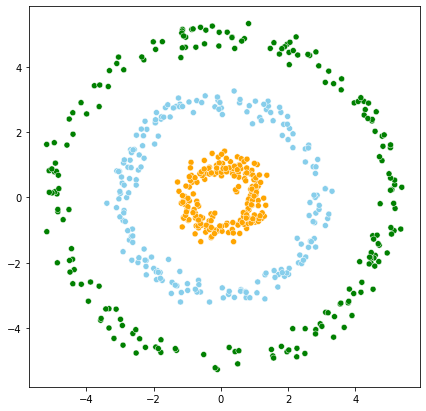

In [13]:
# Concentric circle plot
plt.figure(figsize=(7, 7))
n = 200
r_list = [1, 3, 5]
sigma = 0.2
param_lists = [(r, n, sigma) for r in r_list]
coordinates = [CircleXY(param[0], param[1], param[2]) for param in param_lists]
color_code = {1:'Orange', 3:'Skyblue', 5:'Green'}

for j in range(0, len(coordinates)):
  x,y,group = coordinates[j]
  sns.scatterplot(x=x, y=y, c=[color_code.get(i) for i in group])
plt.show();

In [49]:
# 아래와 같이 데이터를 정리합니다.
X1,X2,y_2_bf=[ np.append(np.append(coordinates[0][i],coordinates[1][i]),coordinates[2][i])  for i in range(0,3)]
X_2=np.c_[X1,X2]
mapping_dic = {1:0, 3:1, 5:2}
y_2_bf2=[mapping_dic.get(i) for i in y_2_bf]
y_2=np.array(y_2_bf2)

# [K-means] - 기본 모형 생성(선형 관계)

In [14]:
from sklearn.cluster import KMeans

In [15]:
km=KMeans(n_clusters=3, random_state=1)
km.fit(X_1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=1, tol=0.0001, verbose=0)

In [16]:
centers = km.cluster_centers_
y_km = km.labels_

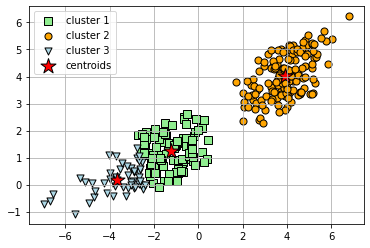

In [18]:
plt.scatter(
    X_1[y_km == 0, 0], X_1[y_km == 0, 1],
    s=50, c='lightgreen',
    marker='s', edgecolor='black',
    label='cluster 1'
)

plt.scatter(
    X_1[y_km == 1, 0], X_1[y_km == 1, 1],
    s=50, c='orange',
    marker='o', edgecolor='black',
    label='cluster 2'
)

plt.scatter(
    X_1[y_km == 2, 0], X_1[y_km == 2, 1],
    s=50, c='lightblue',
    marker='v', edgecolor='black',
    label='cluster 3'
)

# plot the centroids
plt.scatter(
    km.cluster_centers_[:, 0], km.cluster_centers_[:, 1],
    s=250, marker='*',
    c='red', edgecolor='black',
    label='centroids'
)
plt.legend(scatterpoints=1)
plt.grid()
plt.show()

# [K-means] K-means clustering - 최적의 k 찾기 (선형 관계) 

In [20]:
distortions=[]
for i in range(1,11):
  km=KMeans( n_clusters=i, random_state=1)
  km.fit(X_1)
  distortions.append(km.inertia_)

In [21]:
distortions
# K가 1개 있을때부터 10개 있을 때 까지

[4003.9465338062914,
 639.6944972510703,
 409.99949723676724,
 299.58672069789156,
 223.75497718336118,
 185.10323011049246,
 154.36325491395064,
 133.32899316089356,
 117.22310046470062,
 106.76362572560028]

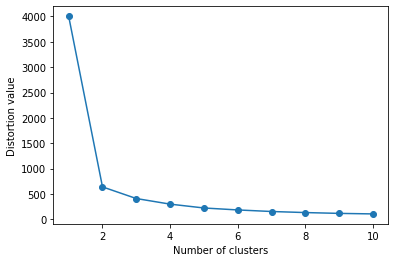

In [22]:
plt.plot(range(1, 11), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion value')
plt.show()

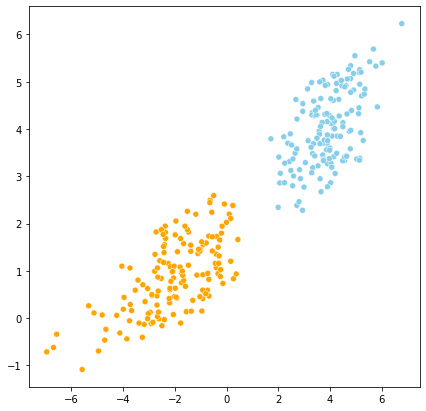

In [23]:
# 위의 클러스터링 결과를 활용하여 클러스터별 color_code를 적용하고 플랏그리기
color_code = {0:'Orange', 1:'Skyblue'}
plt.figure(figsize=(7,7))

km=KMeans(n_clusters=2 , random_state=1)
km.fit(X_1)
y_km=km.labels_

sns.scatterplot(x=X_1[:,0],y=X_1[:,1],c=[color_code.get(i) for i in y_km])
plt.show()

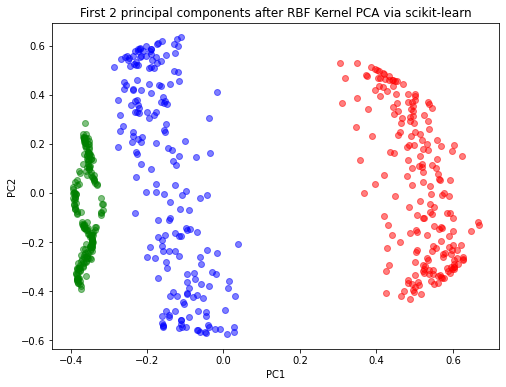

In [50]:
from sklearn.decomposition import KernelPCA
c=0.08
sigmaval=np.sqrt(c/2)


scikit_kpca = KernelPCA(n_components=2, kernel='rbf', gamma=sigmaval)
X_skernpca = scikit_kpca.fit_transform(X_2)

plt.figure(figsize=(8,6))
plt.scatter(X_skernpca[y_2==0, 0], X_skernpca[y_2==0, 1], color='red', alpha=0.5)
plt.scatter(X_skernpca[y_2==1, 0], X_skernpca[y_2==1, 1], color='blue', alpha=0.5)
plt.scatter(X_skernpca[y_2==2, 0], X_skernpca[y_2==2, 1], color='green', alpha=0.5)

plt.title('First 2 principal components after RBF Kernel PCA via scikit-learn')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

##Step 3. Principal Component를 활용한 접근 (선형 관계) 

## [PCA] PCA를 위한 Singular Value Decomposition (SVD) 진행 

In [24]:
## X_1 데이터의 각 변수를 평균이 0이 되도록 만들어 mX에 저장. 이렇게 진행하면 mX의 Quadratic 형태가 Covariance와 상수배가 된다.
mX=X_1
for i in range(X_1.shape[1]):
  mX[:,i]=mX[:,i]-np.mean(X_1[:,i])

In [27]:
# 공분산행렬 구하기
A=np.cov(mX.transpose())
A

array([[10.32543426,  5.22917238],
       [ 5.22917238,  3.06569127]])

In [28]:
## numpy.linalg.svd를 활용하여 SVD를 진행하여 aU, aD, aY에 저장
aU,aD,aV=np.linalg.svd(A)

In [29]:
## PC score를 구해내어서 XY에 저장 후 mX 행렬에 eigenvector를 곱하여 구하기
XV=np.dot(mX,aV)

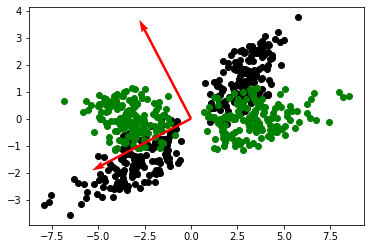

In [30]:
plt.scatter(mX[:,0],mX[:,1],color="black")
plt.scatter(XV[:,0],XV[:,1],color="green")
origin = (0, 0) 
plt.quiver(origin[0],origin[1], aV[0,0], aV[1,0], color=['r','b'], scale=3)
plt.quiver(origin[0],origin[1], aV[0,1], aV[1,1], color=['r','b'], scale=3)
plt.show()

In [31]:
from sklearn.decomposition import PCA

In [34]:
pca = PCA()
pca.fit(X_1)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [36]:
# PCscore는 앞서 구한 XV와 같음.
PCscore=pca.transform(X_1)
print(PCscore[0:5, :])
print(XV[0:5, :])

[[ 2.63595872e+00  9.51221703e-01]
 [-4.79153199e+00 -3.89366241e-03]
 [ 3.67737753e+00  1.95026949e-01]
 [ 3.50983062e+00 -6.04572440e-01]
 [ 3.65909682e+00  1.68818201e-01]]
[[ 2.63595872e+00 -9.51221703e-01]
 [-4.79153199e+00  3.89366241e-03]
 [ 3.67737753e+00 -1.95026949e-01]
 [ 3.50983062e+00  6.04572440e-01]
 [ 3.65909682e+00 -1.68818201e-01]]


In [41]:
# eingen vector를 앞서 구한 aV와 같거나 부호만 다름을 확인
eigens_v=pca.components_.transpose()
print(eigens_v)
print(aV)

[[-0.88606913  0.46355312]
 [-0.46355312 -0.88606913]]
[[-0.88606913 -0.46355312]
 [-0.46355312  0.88606913]]


In [42]:
# Eigen value와 aD 값 확인
print(pca.explained_variance_)
print(aD)

[13.06111151  0.33001402]
[13.06111151  0.33001402]


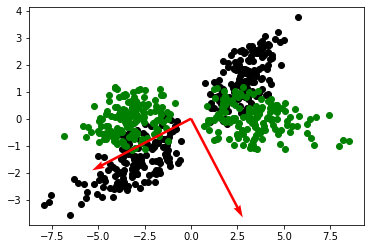

In [43]:
mX=X_1
for i in range(X_1.shape[1]):
    mX[:,i]=mX[:,i]-np.mean(X_1[:,i])

plt.scatter(mX[:,0],mX[:,1],color="black")
plt.scatter(PCscore[:,0],PCscore[:,1],color="green")
origin = (0,0) # origin point
plt.quiver(*origin, eigens_v[0,0], eigens_v[1,0], color=['r','b'], scale=3)
plt.quiver(*origin, eigens_v[0,1], eigens_v[1,1], color=['r','b'], scale=3)
plt.show()

# PC를 활용한 차원축소

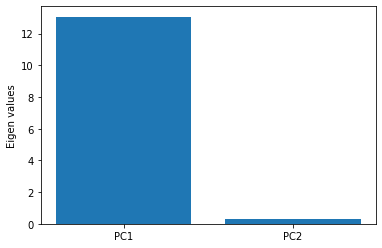

In [44]:
## eigen value를 barplot으로 표현하여 PC1과 PC2의 eigen value 값의 차이를 비교
label = ['PC1', 'PC2']
index = np.arange(len(label))

plt.bar(index,pca.explained_variance_)
plt.ylabel('Eigen values')
plt.xticks(index,label)
plt.show()

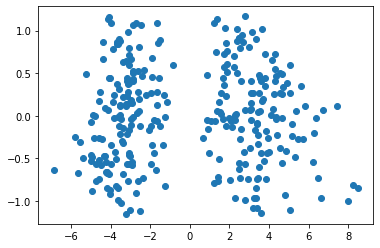

In [45]:
plt.scatter(PCscore[:,0],PCscore[:,1])
plt.show()

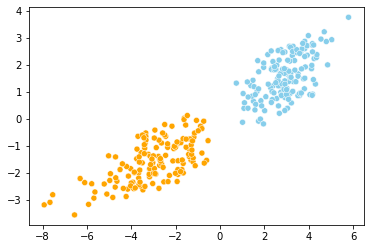

In [46]:
# PC1 만을 활용하여 KMeans clustering을 진행한 후 해당 클러스터로 색상을 넣어 X_1의 Scatter plot을 그리기.

PC1_matrix=np.matrix(PCscore[:,0]).transpose()

km=KMeans(n_clusters=2,random_state=1)
km.fit(PC1_matrix)
y_km=km.labels_
color_code={0:'Orange',1:'Skyblue'}

sns.scatterplot(x=X_1[:,0],y=X_1[:,1],c=[color_code.get(i) for i in y_km])
plt.show()

### 비선형관계 데이터에의 적용

 ### K-means의 비선형 관계 데이터에의 적용

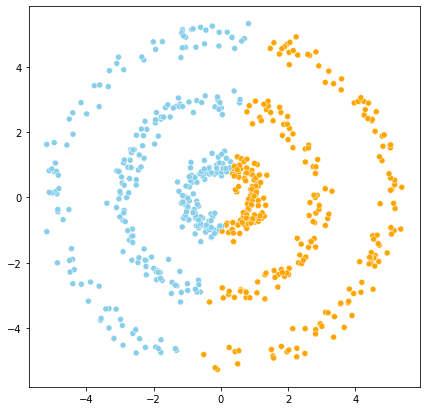

In [51]:
## 비선형 관계 데이터인 X_2를 바탕으로 sklearn.cluster.KMeans를 활용하여 클러스터를 생성한 후 플롯 그리기
color_code = {0:'Orange', 1:'Skyblue'}
plt.figure(figsize=(7,7))

km=KMeans(n_clusters=2,random_state=1)
km.fit(X_2)
y_km=km.labels_

sns.scatterplot(x=X_2[:,0],y=X_2[:,1],c=[color_code.get(i) for i in y_km])
plt.show()

### PCA 비선형관계 데이터에의 적용

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


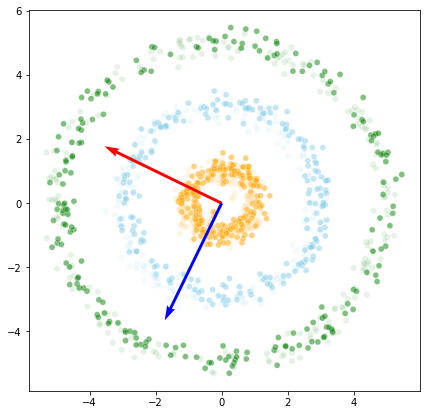

In [52]:
## 비선형 관계 데이터인 X_2를 바탕으로 sklearn.decomposition.PCA 활용하여 PCA를 진행한 후
# PC score에 대하여 seaborn.scatterplot을 이용하고 클러스터별 color_code를 적용하여 플랏을 그림.
# 원본 데이터 (alpha=0.1)와 PC score (alpha=0.5)를 플랏을 함께 그린 뒤 비교하여 어떻게 변했는지를 살펴보기.
pca=PCA()
pca.fit(X_2)
eigens_v=pca.components_.transpose()
PCscore=pca.transform(X_2)
color_code= { 0:'orange',1:'skyblue',2:'green'}

mX=X_2
for i in range(X_2.shape[1]):
  mX[:,i]=mX[:,i]-np.mean(mX[:,i])

plt.figure(figsize=(7,7))

sns.scatterplot(mX[:,0],mX[:,1],c=[color_code.get(i) for i in y_2],alpha=0.1)
sns.scatterplot(PCscore[:,0],PCscore[:,1],c=[color_code.get(i) for i in y_2],alpha=0.5)
origin=(0,0)
plt.quiver(*origin,eigens_v[0,0],eigens_v[1,0],color='r',scale=3)
plt.quiver(*origin,eigens_v[0,1],eigens_v[1,1],color='b',scale=3)



In [53]:
pca.explained_variance_

array([5.93851327, 5.68964896])

### Interleaving half circles 데이터 생성 및 K-means, PCA 적용

In [54]:
from sklearn.datasets import make_moons

In [55]:
# sklearn.datasets.make_moons를 활용하여 n_samples=300, random_state=1을 적용하여 데이터 생성하여 X_3, y_3에 저장.
X_3,y_3 = make_moons(n_samples=300, random_state=1)

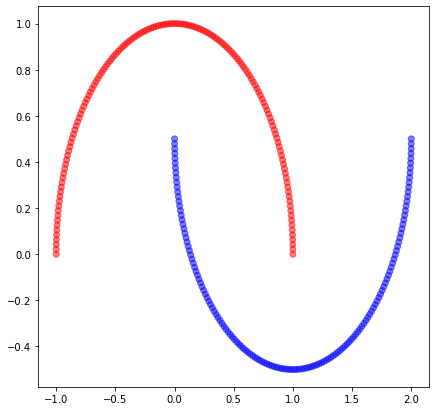

In [56]:
plt.figure(figsize=(7,7))
color_code = {0:'red', 1:'blue'}

plt.scatter(X_3[:,0],X_3[:,1],c=[color_code.get(i) for i in y_3],alpha=0.5)
plt.show()

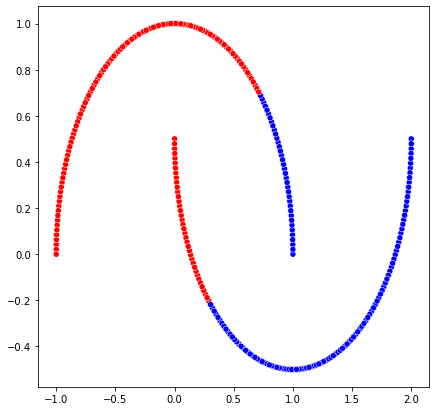

In [57]:
color_code = {0:'red', 1:'blue'}
plt.figure(figsize=(7,7))

km=KMeans(n_clusters=2,random_state=1)
km.fit(X_3)
y_km= km.labels_
sns.scatterplot(x=X_3[:,0],y=X_3[:,1],c=[color_code.get(i) for i in y_km])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


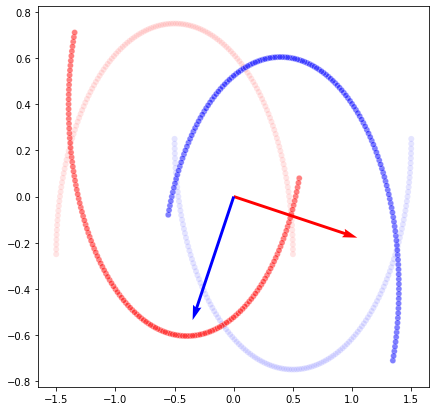

In [59]:
## 비선형 관계 데이터인 X_3를 바탕으로 sklearn.decomposition.PCA 활용하여 PCA를 진행한 후
# PC score에 대하여 seaborn.scatterplot을 이용하고 클러스터별 color_code를 적용하여 플랏을 그리기
# 원본 데이터 (alpha=0.1)와 PC score (alpha=0.5)를 비교하여 어떻게 변했는지를 살펴보기.

pca=PCA()
pca.fit(X_3)
PCscore=pca.transform(X_3)
eigens_v=pca.components_.transpose()
color_code={0:'red',1:'blue'}

mX=X_3
for i in range(X_3.shape[1]):
  mX[:,i]=mX[:,i]-np.mean(mX[:,i])

plt.figure(figsize=(7,7))

sns.scatterplot(mX[:,0],mX[:,1],c=[color_code.get(i) for i in y_3],alpha=0.1)
sns.scatterplot(PCscore[:,0],PCscore[:,1],c=[color_code.get(i) for i in y_3],alpha=0.5)
origin=(0,0)
plt.quiver(*origin,eigens_v[0,0],eigens_v[1,0],color="r",scale=3)
plt.quiver(*origin,eigens_v[0,1],eigens_v[1,1],color="b",scale=3)




# Spiral Data 생성 및 K-means, PCA 적용

In [60]:
!pip install git+https://github.com/lovit/synthetic_dataset

  Cloning https://github.com/lovit/synthetic_dataset to /tmp/pip-req-build-dw54f5tr
  Running command git clone -q https://github.com/lovit/synthetic_dataset /tmp/pip-req-build-dw54f5tr
  Created wheel for soydata: filename=soydata-0.1.0-cp37-none-any.whl size=20033 sha256=56e92b5938310b2db70bab08836d0cf7afea2cf7915056dbd46c50db39e72cd9
  Stored in directory: /tmp/pip-ephem-wheel-cache-5c81cm_n/wheels/df/e8/46/af024e4c7ac5b43bd2a681faa0517d89a51359397a47a3afd3
Successfully built soydata


In [61]:
from soydata.data import *

In [62]:
# soydata.data.classification.make_spiral를 활용하여 n_samples_per_class=500,n_classes=2,
# n_rotations=3, gap_between_spiral=10, gap_between_start_point=1, noise=0.1 을 적용하여 데이터 생성하여 X_4, y_4에 저장.
X_4,y_4 = classification.make_spiral(n_samples_per_class=500,n_classes=2,n_rotations=2,gap_between_spiral=30,noise=0.05)

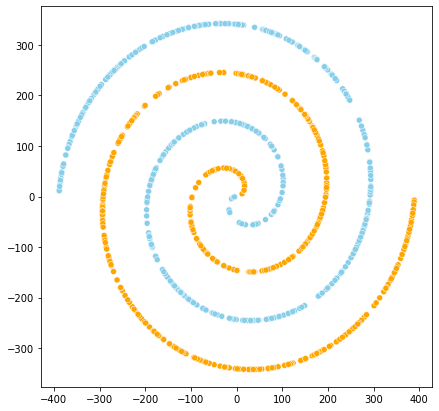

In [63]:
plt.figure(figsize=(7,7))
color_code = {0:'Orange', 1:'Skyblue'}

sns.scatterplot(x=X_4[:,0],y=X_4[:,1],c=[color_code.get(i) for i in y_4])
plt.show()

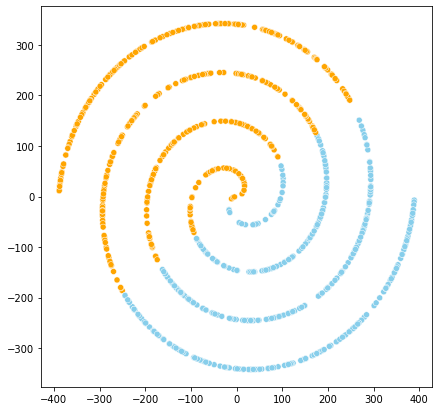

In [64]:
# 비선형 관계 데이터인 X_4를 바탕으로 sklearn.cluster.KMeans를 활용하여 클러스터를 생성한 후
# seaborn.scatterplot을 이용하고 클러스터별 color_code를 적용하여 플랏을 그리기.
color_code = {0:'Orange', 1:'Skyblue'}
plt.figure(figsize=(7,7))

km=KMeans(n_clusters=2,random_state=1)
km.fit(X_4)
y_km=km.labels_
sns.scatterplot(x=X_4[:,0],y=X_4[:,1],c=[color_code.get(i) for i in y_km])
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



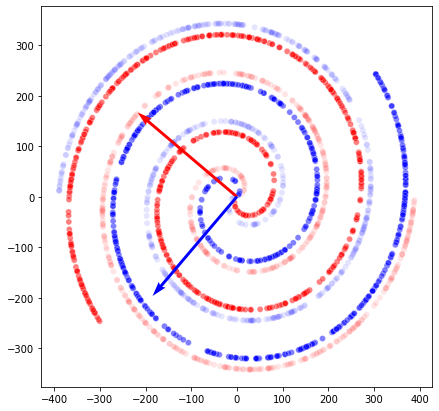

In [65]:
## 비선형 관계 데이터인 X_4를 바탕으로 sklearn.decomposition.PCA 활용하여 PCA를 진행한 후
# PC score에 대하여 seaborn.scatterplot을 이용하고 클러스터별 color_code를 적용하여 플랏을 그림.
# 원본 데이터 (alpha=0.1)와 PC score (alpha=0.5)를 비교하여 어떻게 변했는지를 살펴보기.

pca=PCA()
pca.fit(X_4)
PCscore=pca.transform(X_4)
eigens_v=pca.components_.transpose()
color_code={0:'red',1:'blue'}

mX=X_4
for i in range(X_4.shape[1]):
  mX[:,i]=mX[:,i]-np.mean(mX[:,i])

plt.figure(figsize=(7,7))

sns.scatterplot(mX[:,0],mX[:,1],c=[color_code.get(i) for i in y_4],alpha=0.1)
sns.scatterplot(PCscore[:,0],PCscore[:,1],c=[color_code.get(i) for i in y_4],alpha=0.5)
origin=(0,0)
plt.quiver(*origin,eigens_v[0,0],eigens_v[1,0],color="r",scale=3)
plt.quiver(*origin,eigens_v[0,1],eigens_v[1,1],color="b",scale=3)


### [Kernel PCA] Kernel PCA를 활용하여 비선형 패턴 구분해내기 (Concentric circles)

- Radial basis kernel (rbf) PCA로 진행.
  - Gaussian kernel PCA로도 불림.

In [66]:
from sklearn.decomposition import KernelPCA

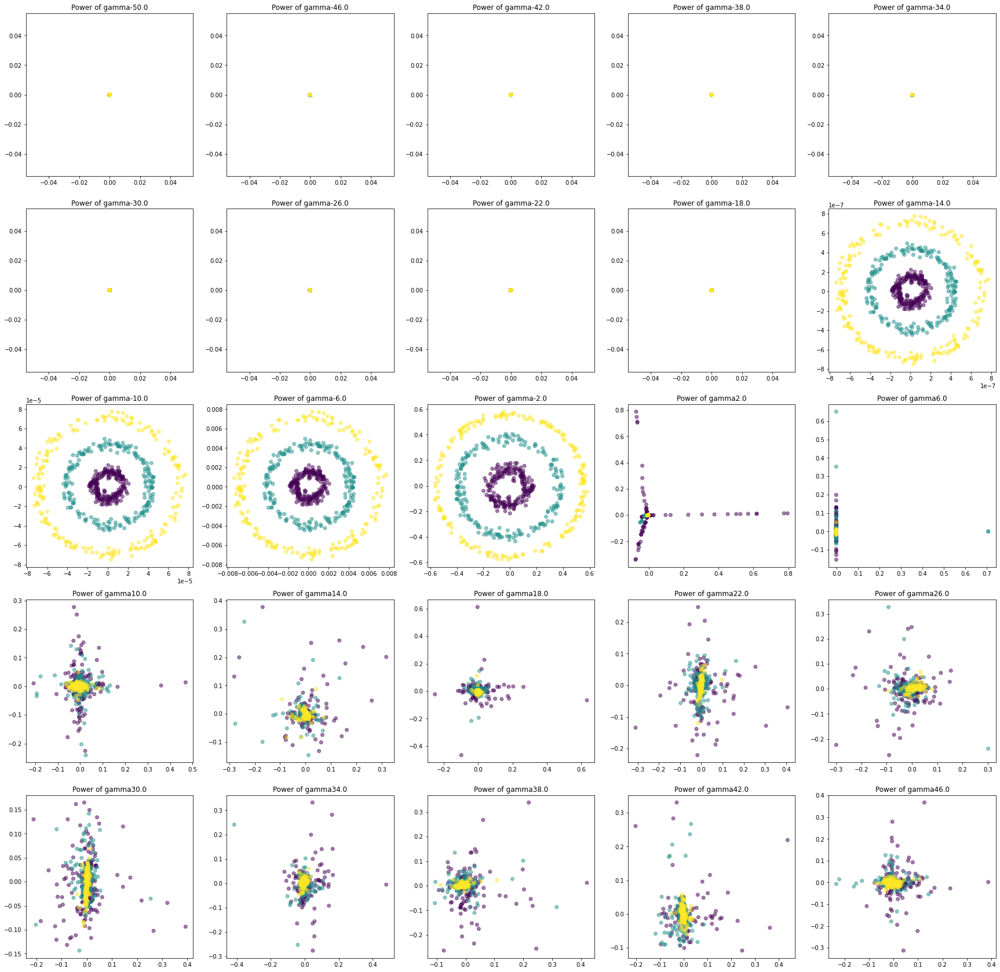

In [67]:
## 데이터 X_2 (Concentric circles)를 이용하고 sklearn.decomposition.KernelPCA를 활용하여 KernelPCA를 진행하고 플랏을 그림.
# 커널은 rbf로 진행.
# 비선형 관계 데이터를 선형으로 바꿔주는 적정한 gamma 값을 찾아야 함.
# 이를 결정하기 위하여 grid를 25개로 주고, 25개의 다양한 gamma값에 대하여 KenrnelPCA를 진행하고 플랏을 그린 후 적정 gamma에 대하여 고민해야함.
# 본 과정은 gamma의 범위를 좁혀가며 여러번 진행될 수 있음.

g_start=-50 # 감마의 시작과 끝 지정
g_end=50
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_2)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)



- 분포가 없어지기 직전이기에 다시 그려주어야함.

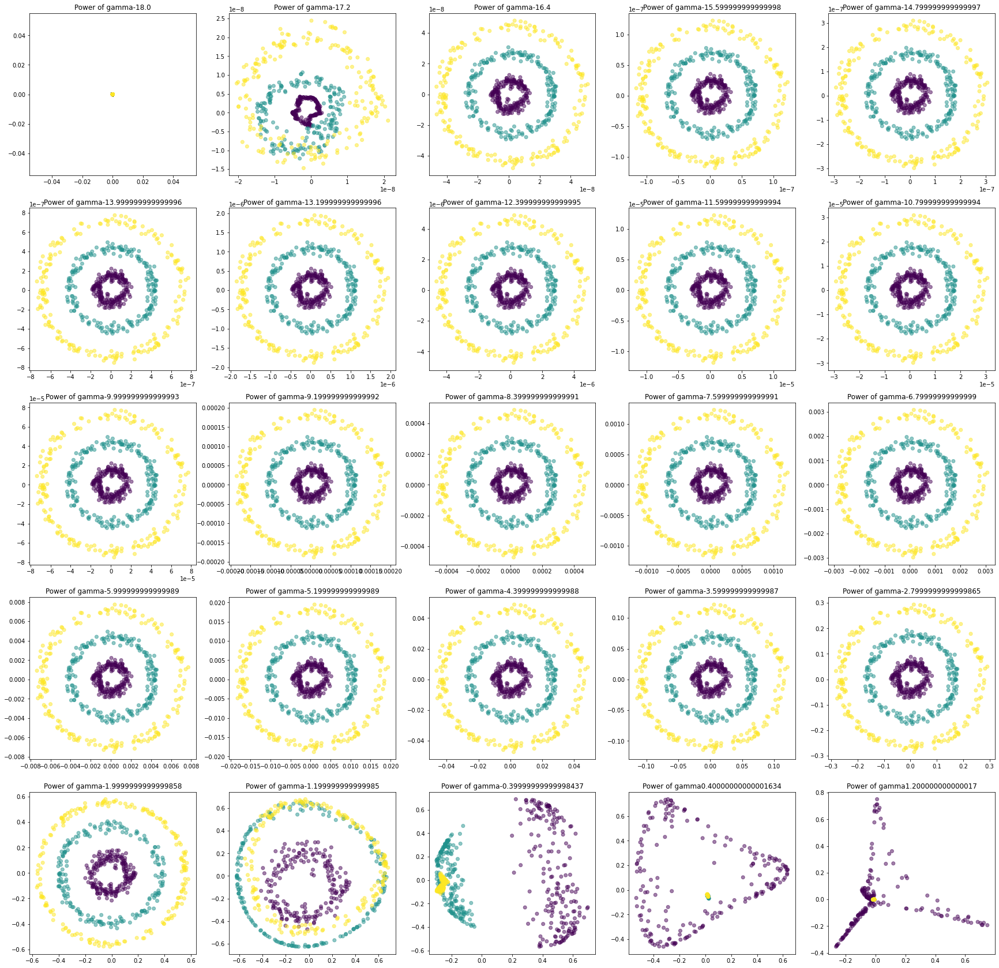

In [69]:
g_start=-18 # 감마의 시작과 끝 지정
g_end=2
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_2)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)


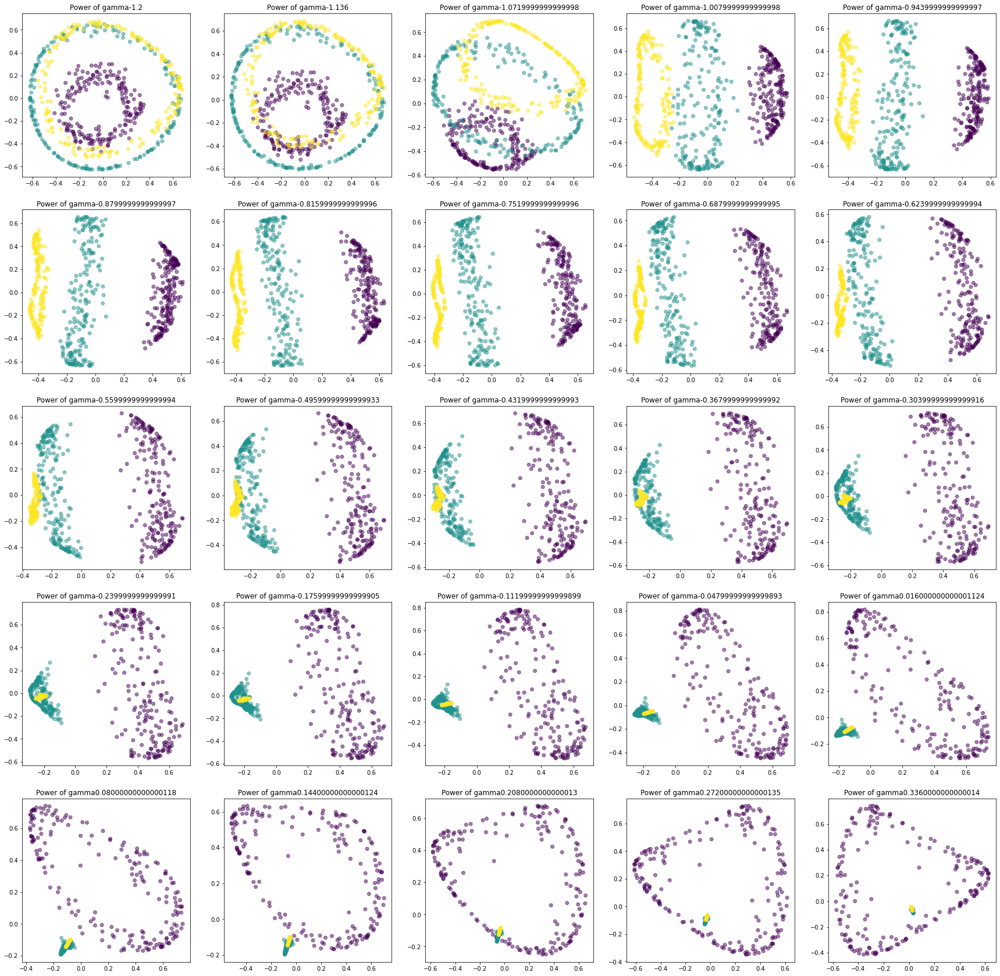

In [70]:
g_start=-1.2 # 감마의 시작과 끝 지정
g_end=0.4
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_2)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)


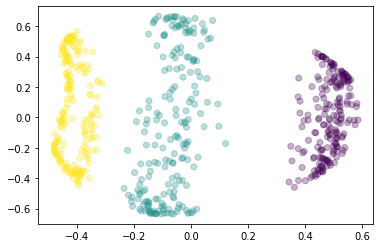

In [71]:
# 적정한 Gamma를 결정하고 이를 바탕으로 플랏을 그림.

g_power_val=-0.94
g_value=10**g_power_val
scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
X_skernpca = scikit_kpca.fit_transform(X_2)

plt.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.3)
plt.show()

- Polynomial kernel PCA로 진행.

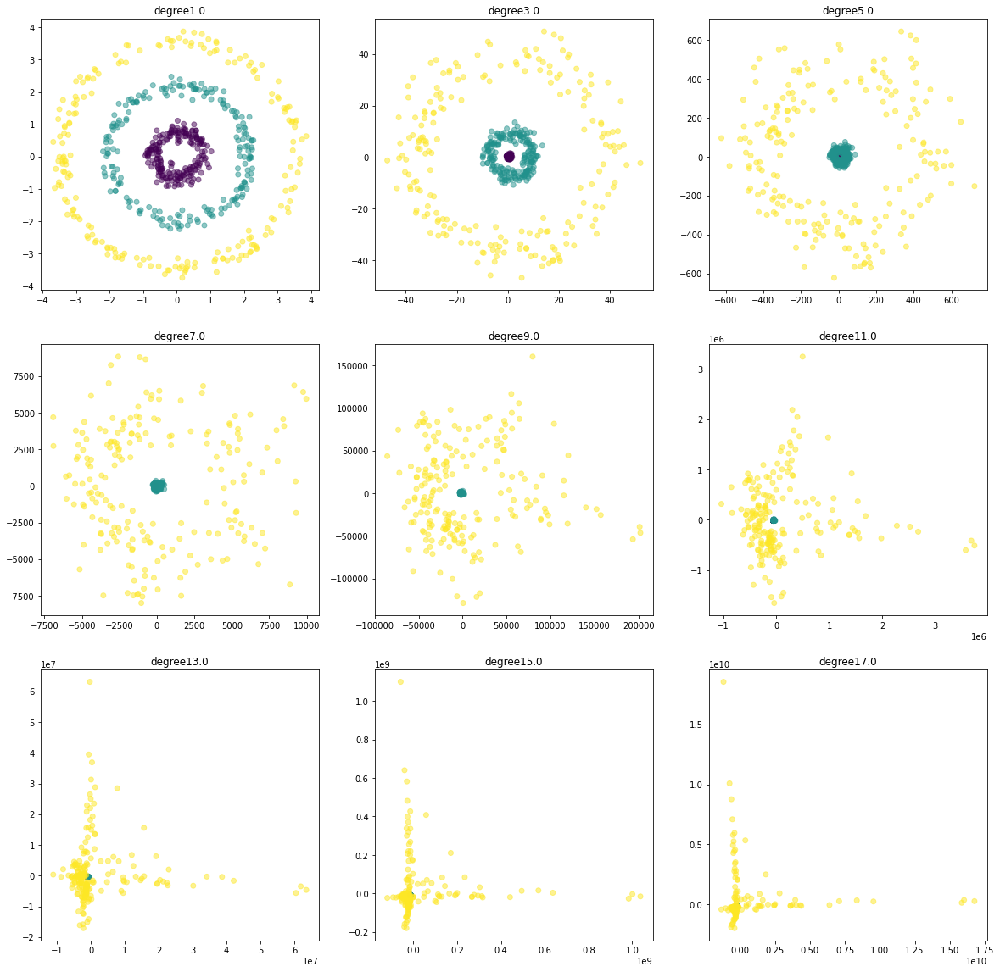

In [72]:
## 데이터 X_2 (Concentric circles)를 이용하고 sklearn.decomposition.KernelPCA를 활용하여 KernelPCA를 진행하고 플랏을 그림.
# 커널은 poly로 진행.
# 비선형 관계 데이터를 선형으로 바꿔주는 적정한 degree 값을 찾아야 함.
# 이를 결정하기 위하여 grid를 25개로 주고, 25개의 다양한 degree 값에 대하여 KenrnelPCA를 진행하고 플랏을 그린 후 적정 degree에 대하여 고민.
# 본 과정은 degree의 범위를 좁혀가며 여러번 진행될 수 있음.
# 적정 degree를 찾았다면, gamma, coef0에 대해서도 마찬가지로 진행.

g_start=1
g_end=19
g_power = np.arange(g_start,g_end, (g_end-g_start)/9)

fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(20,20),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='poly',degree=g_power[n])
  X_skernpca = scikit_kpca.fit_transform(X_2)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.5)
  ax.set_title('degree'+str(g_power[n]),size=12)

- Sigmoid kernel PCA로 진행.

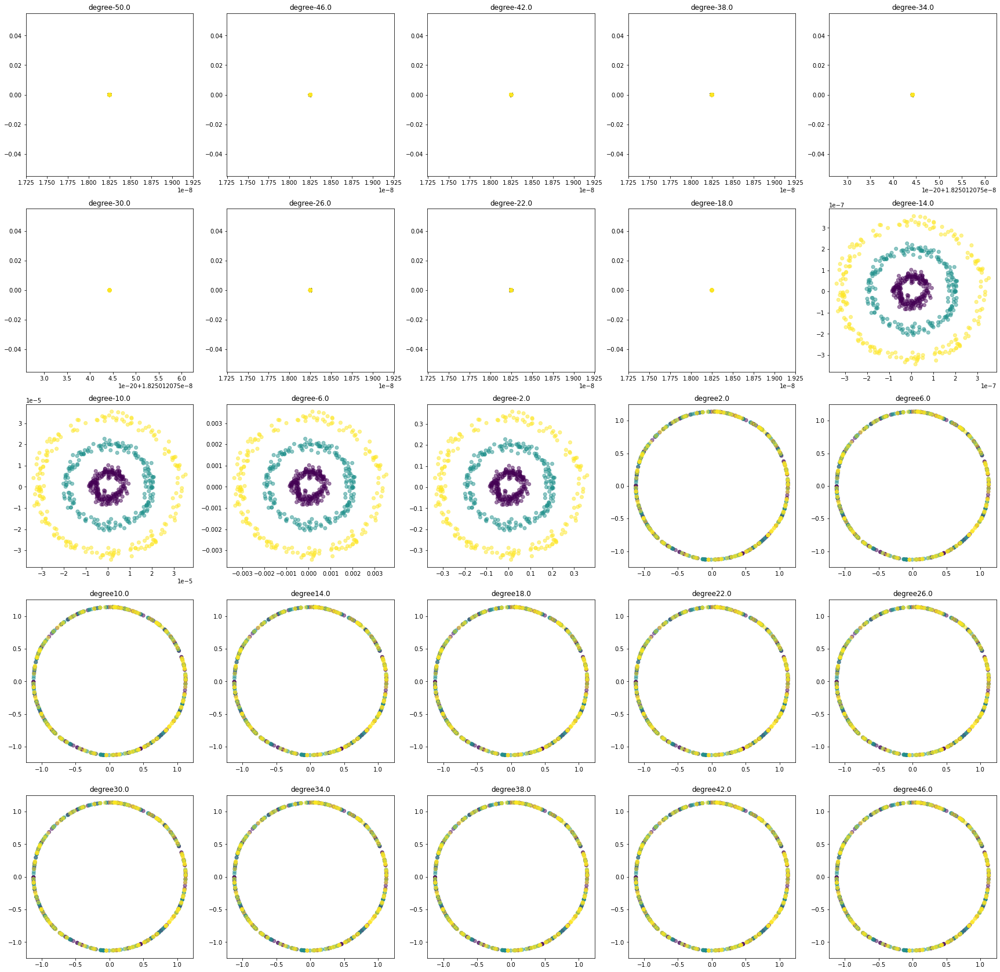

In [73]:
g_start = -50
g_end= 50
g_power = np.arange(g_start,g_end,(g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate (axs.flatten()):
  g_value=10**(g_power[n])
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_2)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.5)
  ax.set_title('degree'+str(g_power[n]),size=12)
  
plt.show()

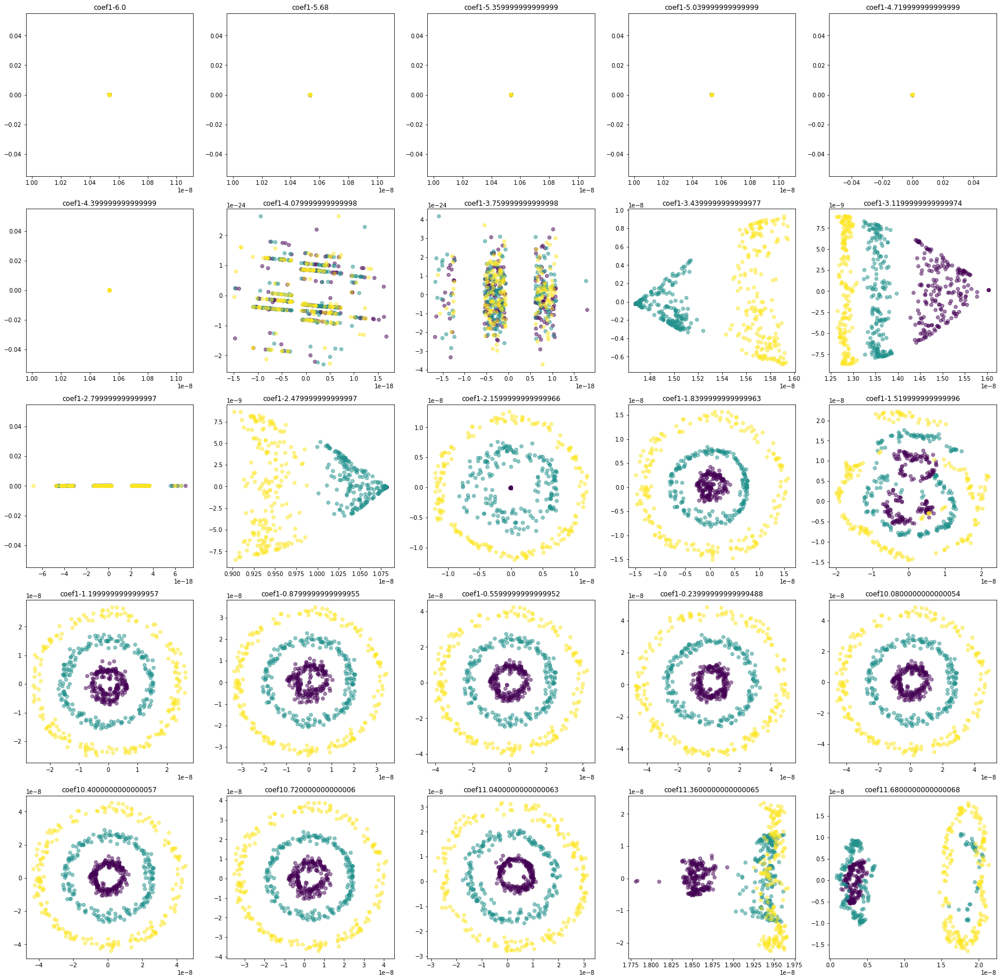

In [74]:
g_start = -6
g_end= 2
g_power = np.arange(g_start,g_end,(g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate (axs.flatten()):
  g_value=10**(-16.096)
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value,coef0=g_power[n])
  X_skernpca = scikit_kpca.fit_transform(X_2)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.5)
  ax.set_title('coef1'+str(g_power[n]),size=12)
  
plt.show()

In [75]:
g_power

array([-6.  , -5.68, -5.36, -5.04, -4.72, -4.4 , -4.08, -3.76, -3.44,
       -3.12, -2.8 , -2.48, -2.16, -1.84, -1.52, -1.2 , -0.88, -0.56,
       -0.24,  0.08,  0.4 ,  0.72,  1.04,  1.36,  1.68])

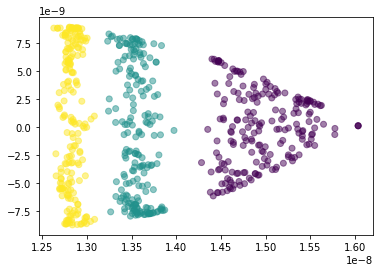

In [76]:

g_value=10**(-16.096)
scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value,coef0=g_power[9])
X_skernpca = scikit_kpca.fit_transform(X_2)
plt.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_2,alpha=0.5)
plt.show()

In [77]:
PC1_matrix=np.matrix(X_skernpca[:,0]).transpose()
km=KMeans(n_clusters=3,random_state=1)
km.fit(PC1_matrix)

y_km=km.labels_

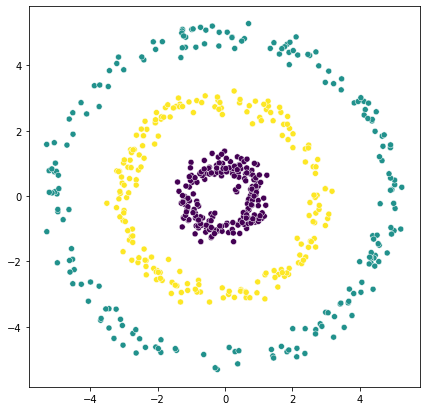

In [78]:
plt.figure(figsize=(7,7))
sns.scatterplot(x=X_2[:,0],y=X_2[:,1],c=y_km)

### [Kernel PCA] Kernel PCA를 활용하여 비선형 패턴 구분해내기 (Interleaving half circles)
- Radial basis kernel (rbf) PCA로 진행.

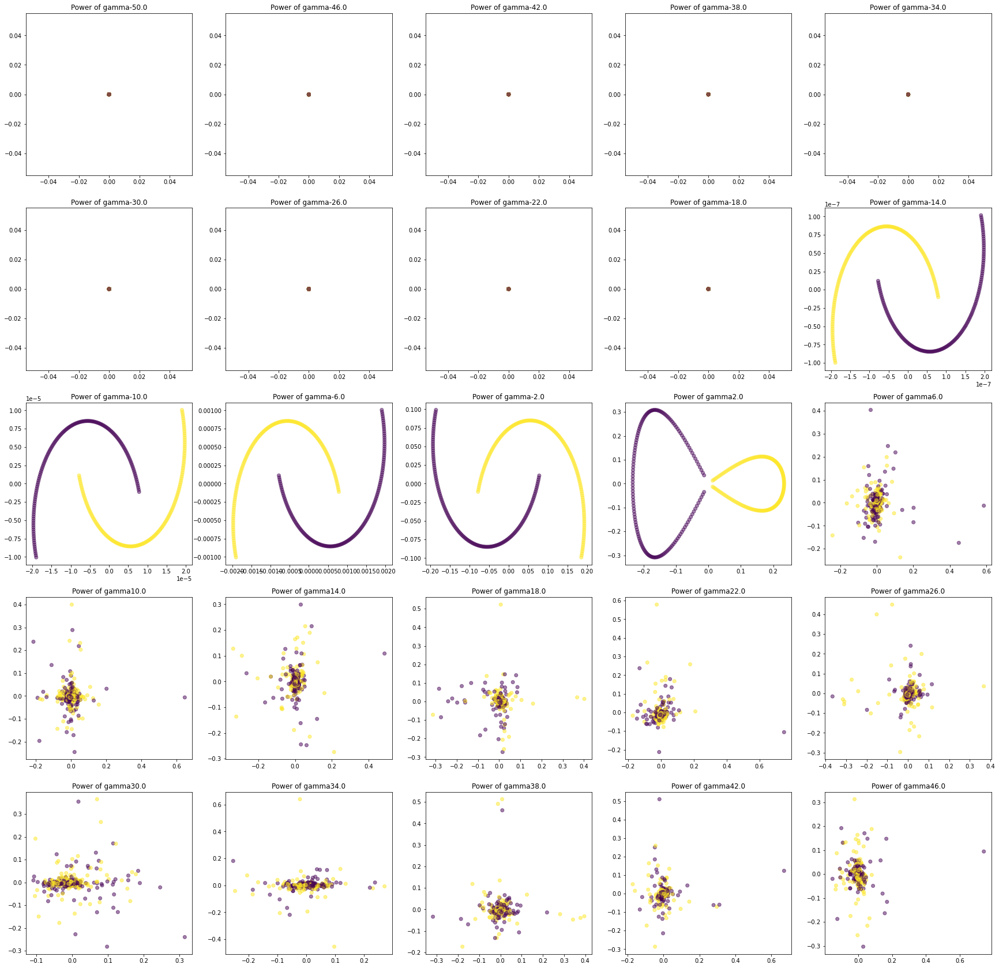

In [79]:
g_start=-50
g_end=50
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)

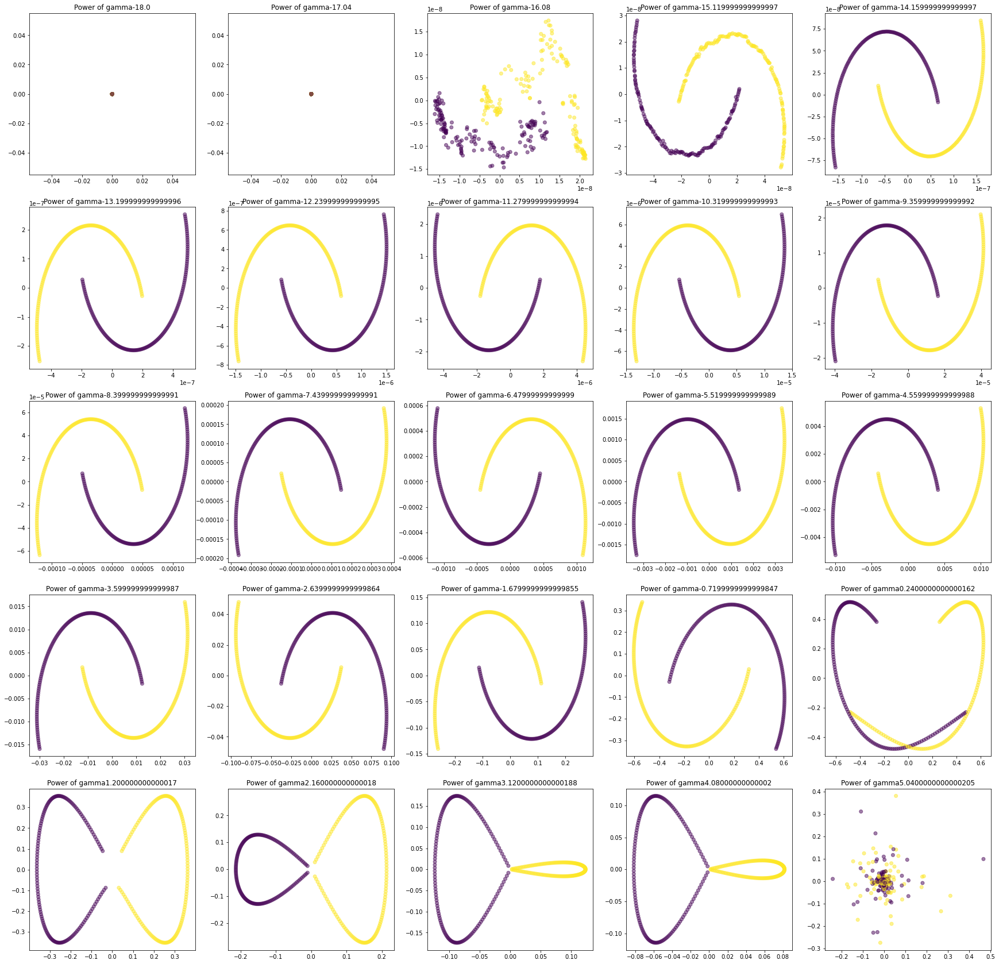

In [80]:
g_start=-18
g_end=6
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)

- Polynomial kernel PCA로 진행.

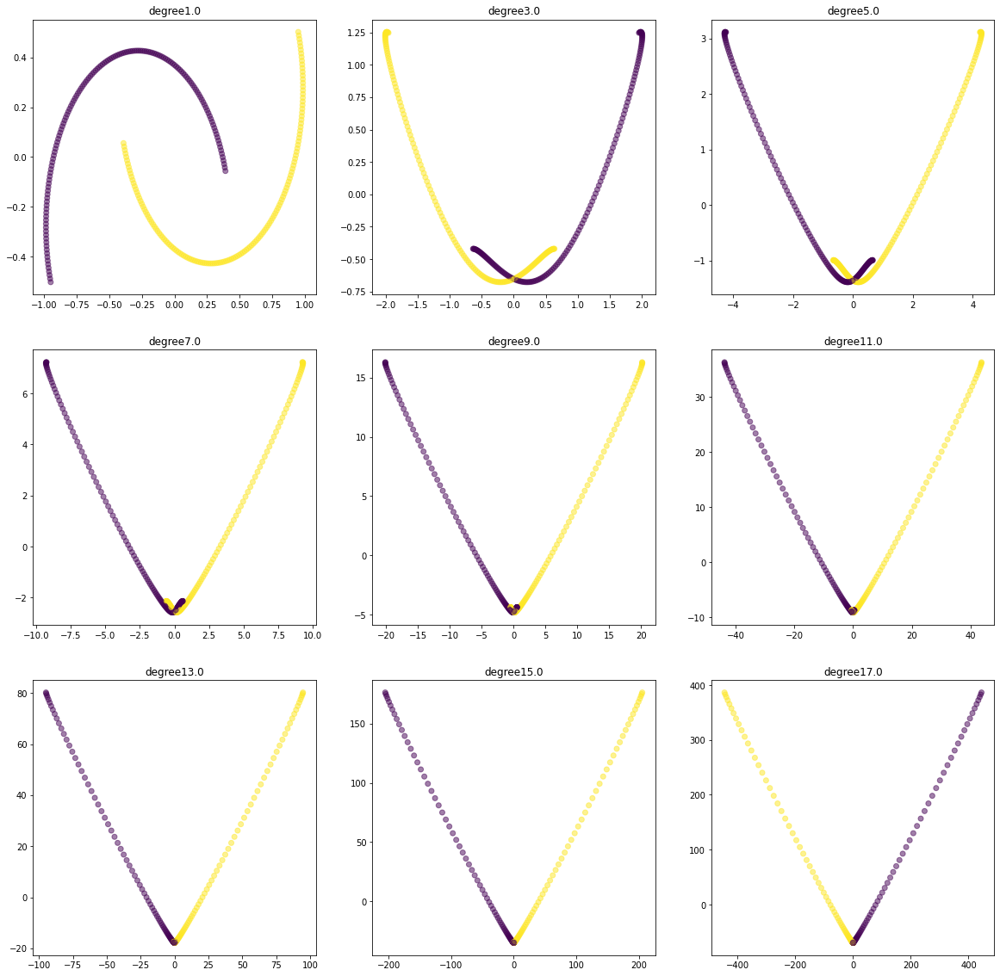

In [81]:
g_start=1
g_end=19
g_power = np.arange(g_start,g_end, (g_end-g_start)/9)

fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(20,20),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='poly',degree=g_power[n])
  X_skernpca = scikit_kpca.fit_transform(X_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title('degree'+str(g_power[n]),size=12)

- Sigmoid kernel PCA로 진행.

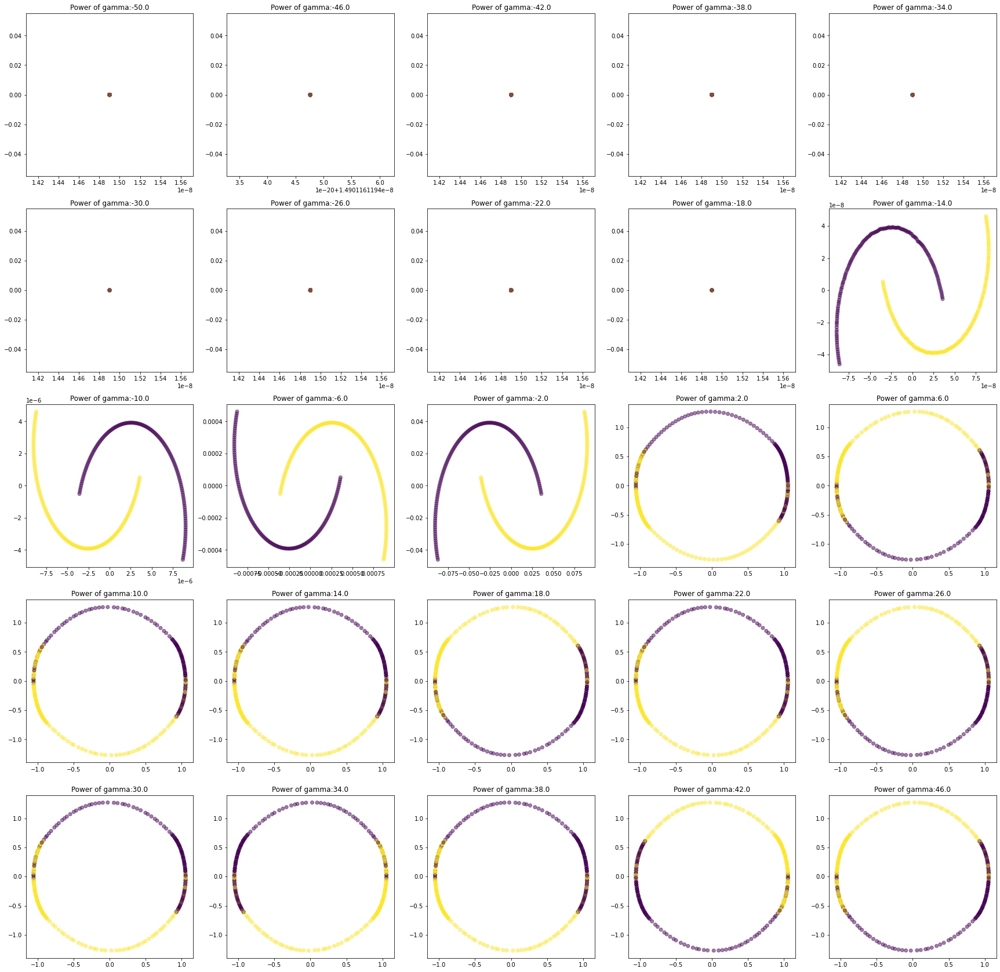

In [82]:
g_start=-50
g_end=50
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

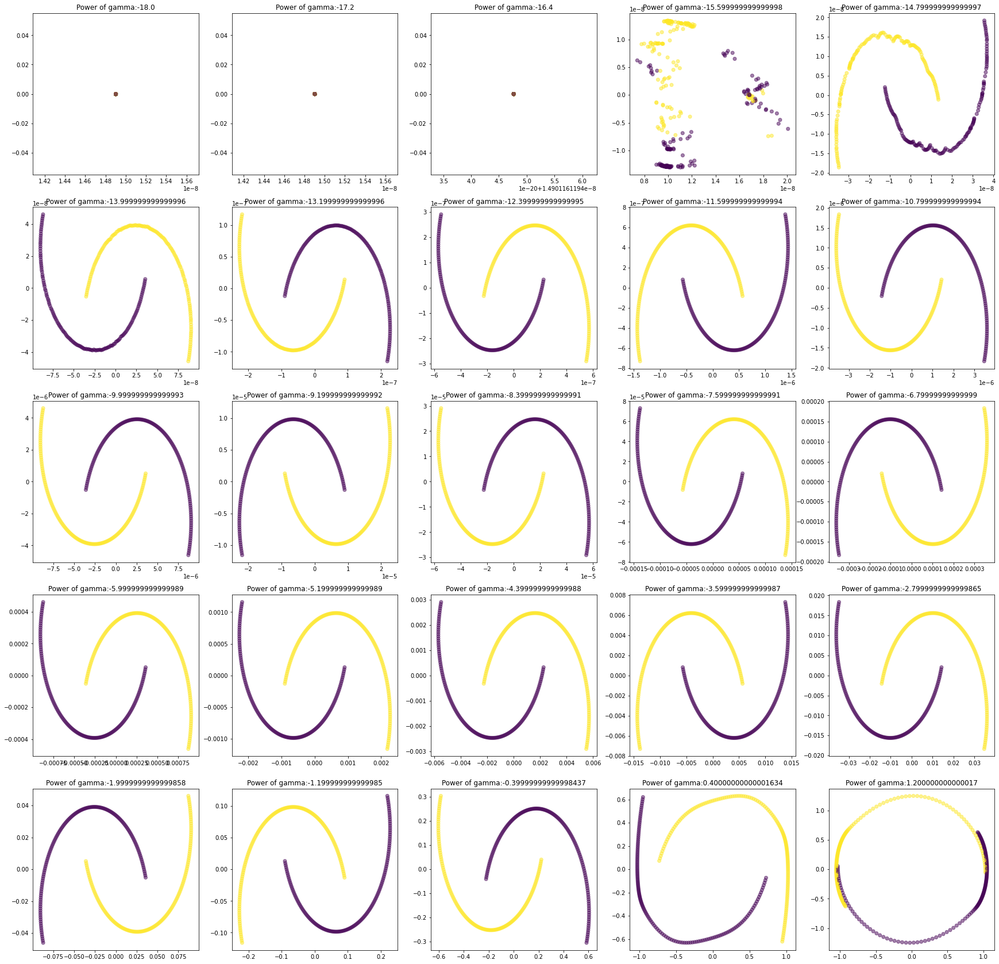

In [83]:
g_start=-18
g_end=2
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

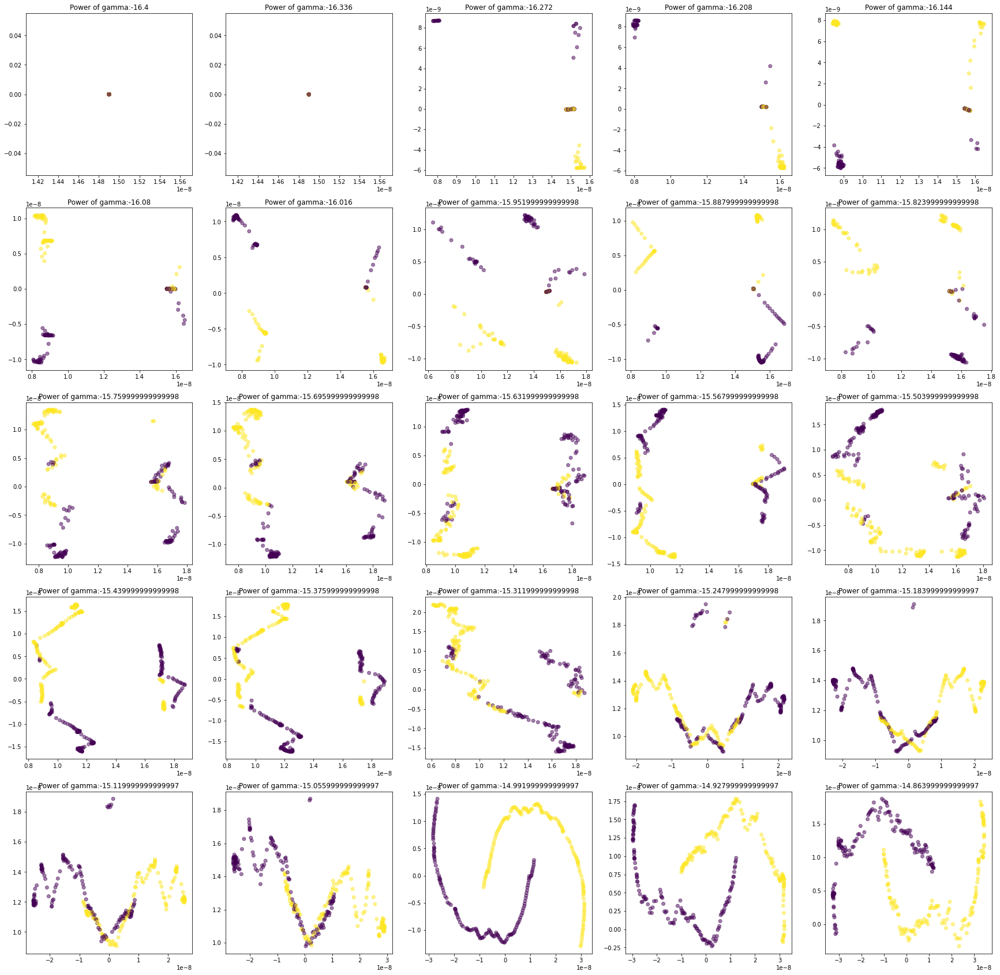

In [84]:
g_start=-16.4
g_end=-14.8
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

### [Kernel PCA] Kernel PCA를 활용하여 비선형 패턴 구분해내기 (Spiral)

- Radial basis kernel (rbf) PCA로 진행.

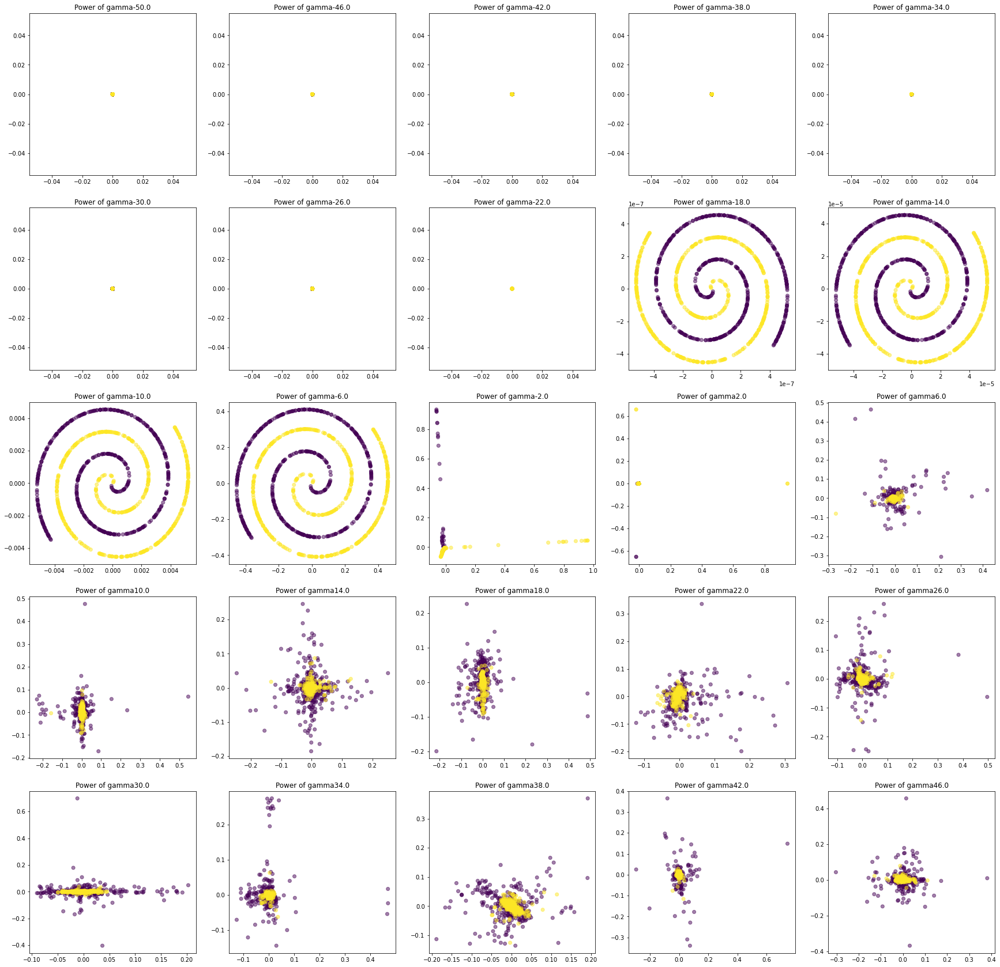

In [85]:
g_start=-50
g_end=50
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)

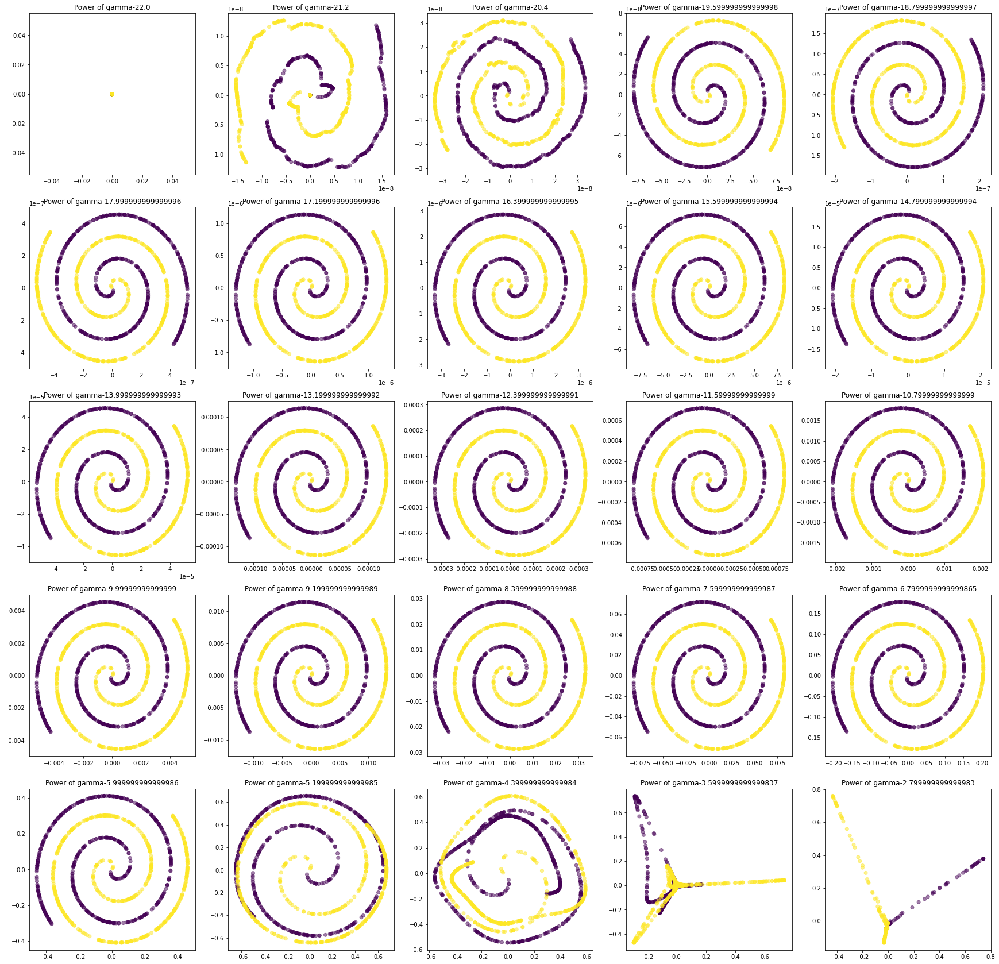

In [86]:

g_start=-22
g_end=-2
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)

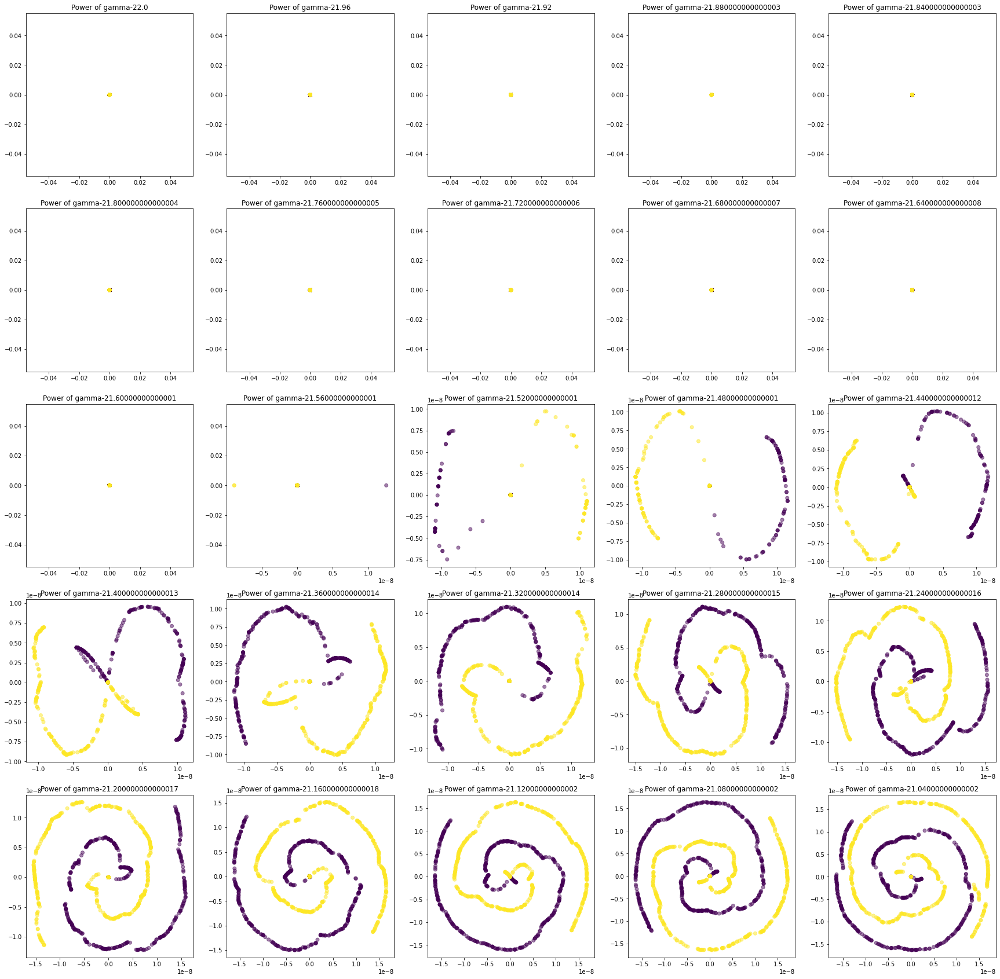

In [87]:
g_start=-22
g_end=-21
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(X_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)

- Polynomial kernel PCA로 진행.

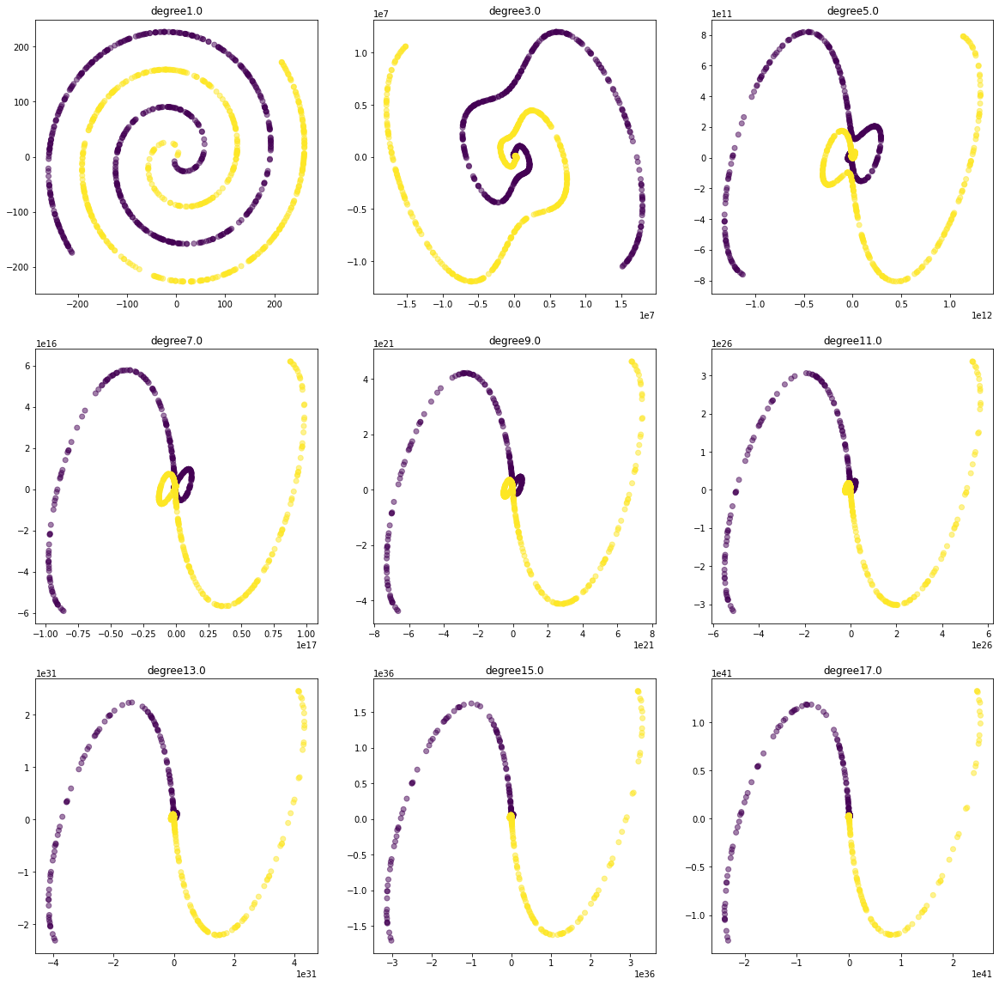

In [88]:
g_start=1
g_end=19
g_power = np.arange(g_start,g_end, (g_end-g_start)/9)

fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(20,20),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='poly',degree=g_power[n])
  X_skernpca = scikit_kpca.fit_transform(X_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title('degree'+str(g_power[n]),size=12)

- Sigmoid kernel PCA로 진행.

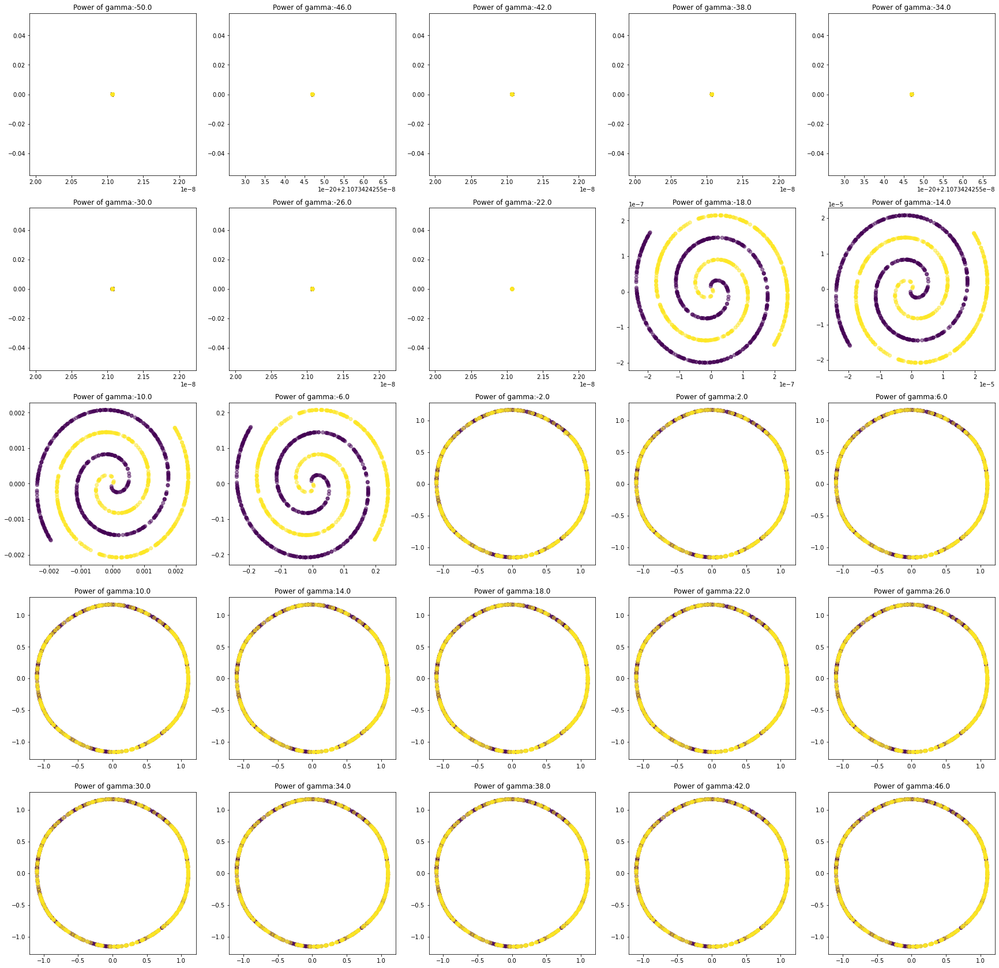

In [89]:
g_start=-50
g_end=50
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

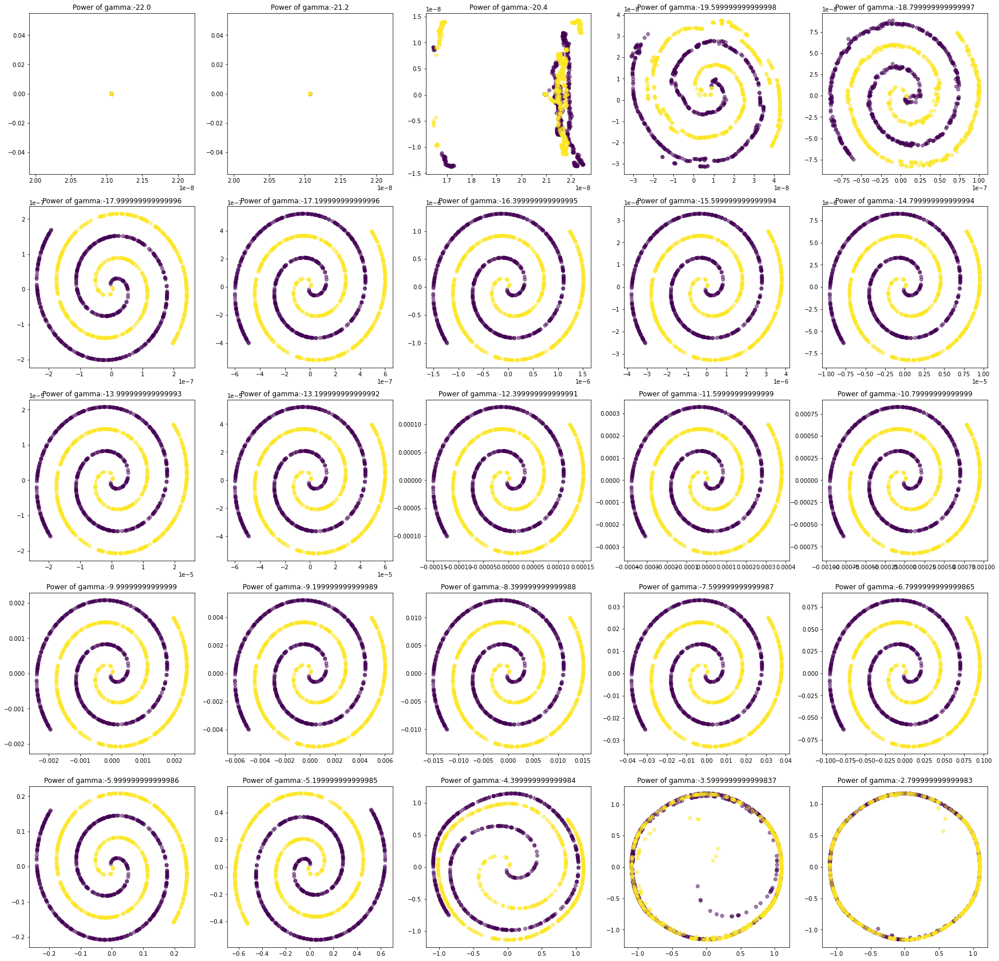

In [90]:
g_start=-22
g_end=-2
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

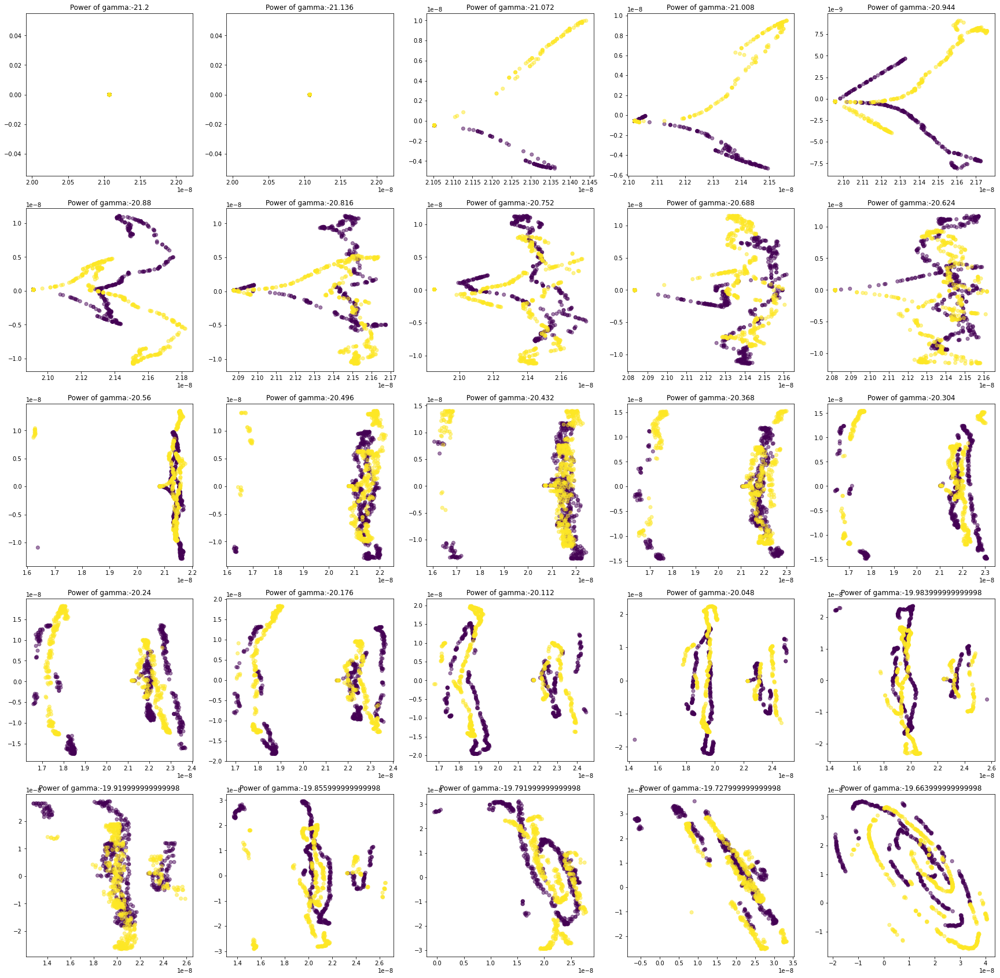

In [91]:
g_start=-21.2
g_end=-19.6
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

## PCA, Kernel PCA의 탐색적 데이터 분석에의 적용

In [92]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [93]:
import os
os.chdir('/content/')
path = "./drive/MyDrive/P3C1"
file_list = os.listdir(path)

print ("file_list: {}".format(file_list))

file_list: ['Faults.NNA', 'Faults27x7_var']


In [94]:

df = pd.read_csv("/content/drive/MyDrive/P3C1/Faults.NNA",  delimiter='\t', header=None)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0
2,829,835,1553913,1553931,71,8,19,7972,99,125,1623,1,0,100,0.9710,0.3426,0.3333,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0
3,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0
4,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0


In [95]:
attributes_name=pd.read_csv("/content/drive/MyDrive/P3C1/Faults27x7_var",  delimiter=' ', header=None)
df.columns=attributes_name[0]

In [96]:
conditions_bf=[df['Pastry'],
               df['Z_Scratch'],
               df['K_Scatch'],
               df['Stains'],
               df['Dirtiness'],
               df['Bumps'],
               df['Other_Faults']
               ]
conditions=list(map(lambda i: i.astype(bool), conditions_bf))
choices = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps', 'Other_Faults']
df['class']=np.select(conditions,choices)

In [97]:
df.head()

,X_Minimum,X_Maximum,Y_Minimum,Y_Maximum,Pixels_Areas,X_Perimeter,Y_Perimeter,Sum_of_Luminosity,Minimum_of_Luminosity,Maximum_of_Luminosity,Length_of_Conveyer,TypeOfSteel_A300,TypeOfSteel_A400,Steel_Plate_Thickness,Edges_Index,Empty_Index,Square_Index,Outside_X_Index,Edges_X_Index,Edges_Y_Index,Outside_Global_Index,LogOfAreas,Log_X_Index,Log_Y_Index,Orientation_Index,Luminosity_Index,SigmoidOfAreas,Pastry,Z_Scratch,K_Scatch,Stains,Dirtiness,Bumps,Other_Faults,class
0,42,50,270900,270944,267,17,44,24220,76,108,1687,1,0,80,0.0498,0.2415,0.1818,0.0047,0.4706,1.0000,1.0,2.4265,0.9031,1.6435,0.8182,-0.2913,0.5822,1,0,0,0,0,0,0,Pastry
1,645,651,2538079,2538108,108,10,30,11397,84,123,1687,1,0,80,0.7647,0.3793,0.2069,0.0036,0.6000,0.9667,1.0,2.0334,0.7782,1.4624,0.7931,-0.1756,0.2984,1,0,0,0,0,0,0,Pastry
2,829,835,1553913,1553931,71,8,19,7972,99,125,1623,1,0,100,0.9710,0.3426,0.3333,0.0037,0.7500,0.9474,1.0,1.8513,0.7782,1.2553,0.6667,-0.1228,0.2150,1,0,0,0,0,0,0,Pastry
3,853,860,369370,369415,176,13,45,18996,99,126,1353,0,1,290,0.7287,0.4413,0.1556,0.0052,0.5385,1.0000,1.0,2.2455,0.8451,1.6532,0.8444,-0.1568,0.5212,1,0,0,0,0,0,0,Pastry
4,1289,1306,498078,498335,2409,60,260,246930,37,126,1353,0,1,185,0.0695,0.4486,0.0662,0.0126,0.2833,0.9885,1.0,3.3818,1.2305,2.4099,0.9338,-0.1992,1.0000,1,0,0,0,0,0,0,Pastry


In [98]:
color_code = {'Pastry':'Red', 'Z_Scratch':'Blue', 'K_Scatch':'Green', 'Stains':'Black', 'Dirtiness':'Pink', 'Bumps':'Brown', 'Other_Faults':'Gold'}
color_list = [color_code.get(i) for i in df.loc[:,'class']]
df_corTarget = df[['K_Scatch','X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
       'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
       'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer',
       'TypeOfSteel_A300', 'TypeOfSteel_A400', 'Steel_Plate_Thickness',
       'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
       'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas',
       'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
       'SigmoidOfAreas']]
corr=df_corTarget.corr()

In [99]:
choices2 = ['Pastry', 'Z_Scratch', 'K_Scatch', 'Stains', 'Dirtiness', 'Bumps']
X_5_bf3 = df[['X_Minimum', 'X_Maximum', 'Y_Minimum', 'Y_Maximum', 'Pixels_Areas',
       'X_Perimeter', 'Y_Perimeter', 'Sum_of_Luminosity',
       'Minimum_of_Luminosity', 'Maximum_of_Luminosity', 'Length_of_Conveyer',
       'TypeOfSteel_A300',  'Steel_Plate_Thickness',
       'Edges_Index', 'Empty_Index', 'Square_Index', 'Outside_X_Index',
       'Edges_X_Index', 'Edges_Y_Index', 'Outside_Global_Index', 'LogOfAreas',
       'Log_X_Index', 'Log_Y_Index', 'Orientation_Index', 'Luminosity_Index',
       'SigmoidOfAreas']]

import random
random.seed(2000)
y_5_bf=df['class']
X_5_bf2 = X_5_bf3
X_5_bf=X_5_bf2.loc[y_5_bf.isin(choices2),:]
ind_row=[]
for i in range(0,len(choices2)):  
   ind_row.extend(random.sample(np.where(df['class']==choices2[i])[0].tolist(),55))

X_5=X_5_bf.iloc[ind_row,:]

In [100]:
mapping_dic = {1:0, 3:1, 5:2}
y_5=y_5_bf[np.where(y_5_bf.isin(choices2))[0]][ind_row]
color_code = {'Pastry':'Red', 'Z_Scratch':'Blue', 'K_Scatch':'Green', 'Stains':'Black', 'Dirtiness':'Pink', 'Bumps':'Brown', 'Other_Faults':'Gold'}
y_color=[color_code.get(i) for i in y_5]

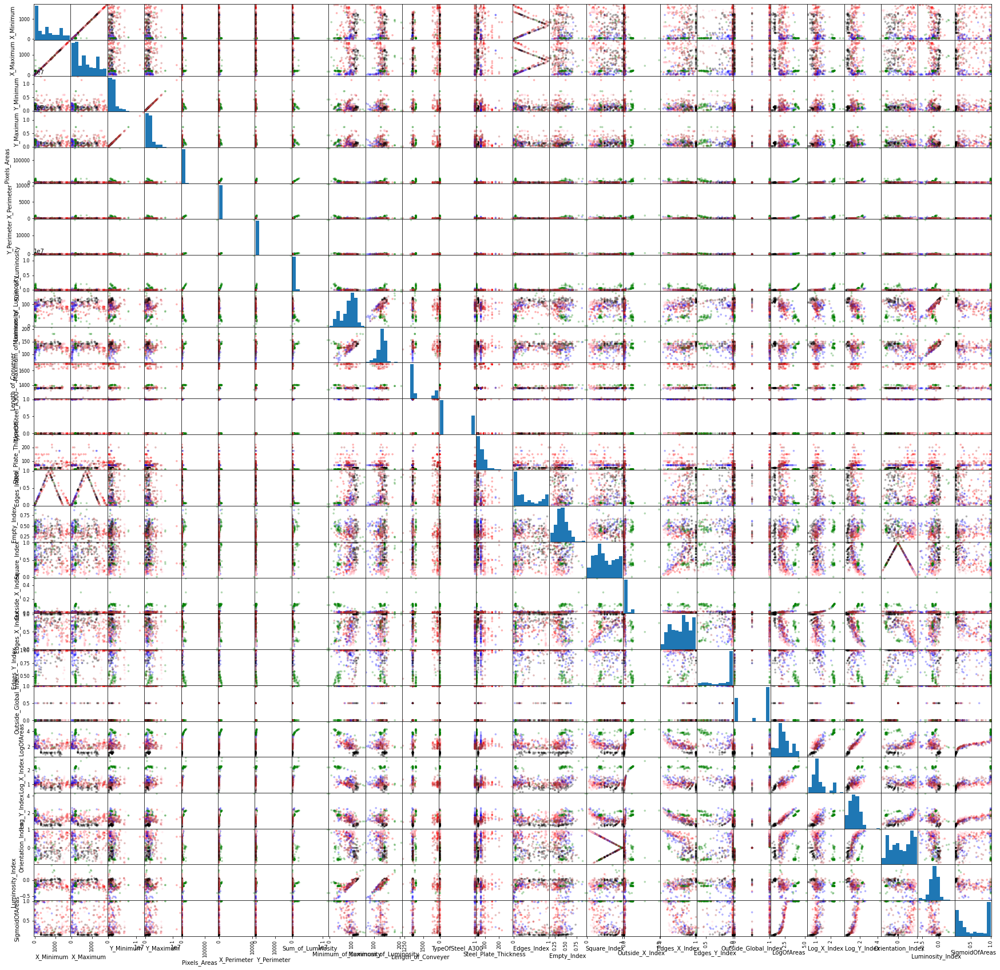

In [101]:
# scatter plot을 그리고 대각원소에는 히스토그램을 출력
pd.plotting.scatter_matrix(X_5,
                                       c=y_color,
                                       figsize= [30,30],
                                       diagonal='hist',
                                       alpha=0.3,
                                       s = 50)
plt.show()

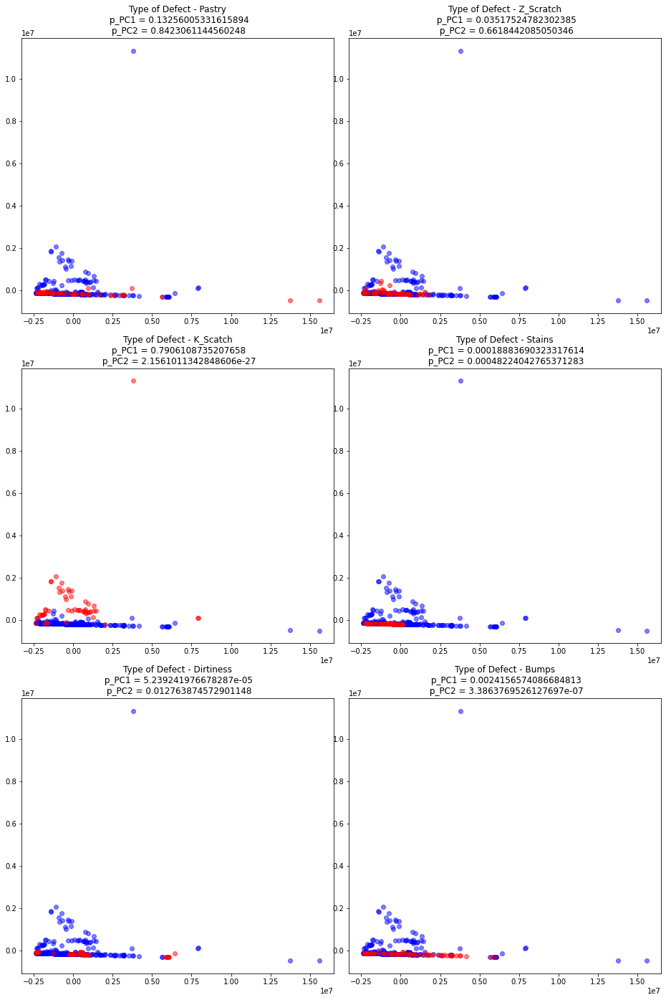

In [102]:
# 우선 PCA를 진행하여 데이터가 전반적으로 어느 Defect와 선형관계에 있는지를 살펴보기.
from sklearn.decomposition import PCA
from scipy import stats
scikit_pca = PCA(n_components=2)
X_spca = scikit_pca.fit_transform(X_5)

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(16,24), sharex=False, sharey=False)

for n, ax in enumerate(axs.flatten()):  
    t, p = stats.ranksums(X_spca[y_5!=choices2[n], 0],X_spca[y_5==choices2[n], 0])
    t2, p2 = stats.ranksums(X_spca[y_5!=choices2[n], 1],X_spca[y_5==choices2[n], 1])  
    ax.scatter(X_spca[y_5!=choices2[n], 0], X_spca[y_5!=choices2[n], 1], color='blue', alpha=0.5)
    ax.scatter(X_spca[y_5==choices2[n], 0], X_spca[y_5==choices2[n], 1], color='red', alpha=0.5)
    ax.set_title('Type of Defect - ' + choices2[n]+"\n p_PC1 = " + str(p)+"\n p_PC2 = " + str(p2), size = 12)

plt.suptitle('', y = 0.95)
plt.subplots_adjust(wspace=0.05)
plt.show()

### 탐색적 분석을 위한 PCA

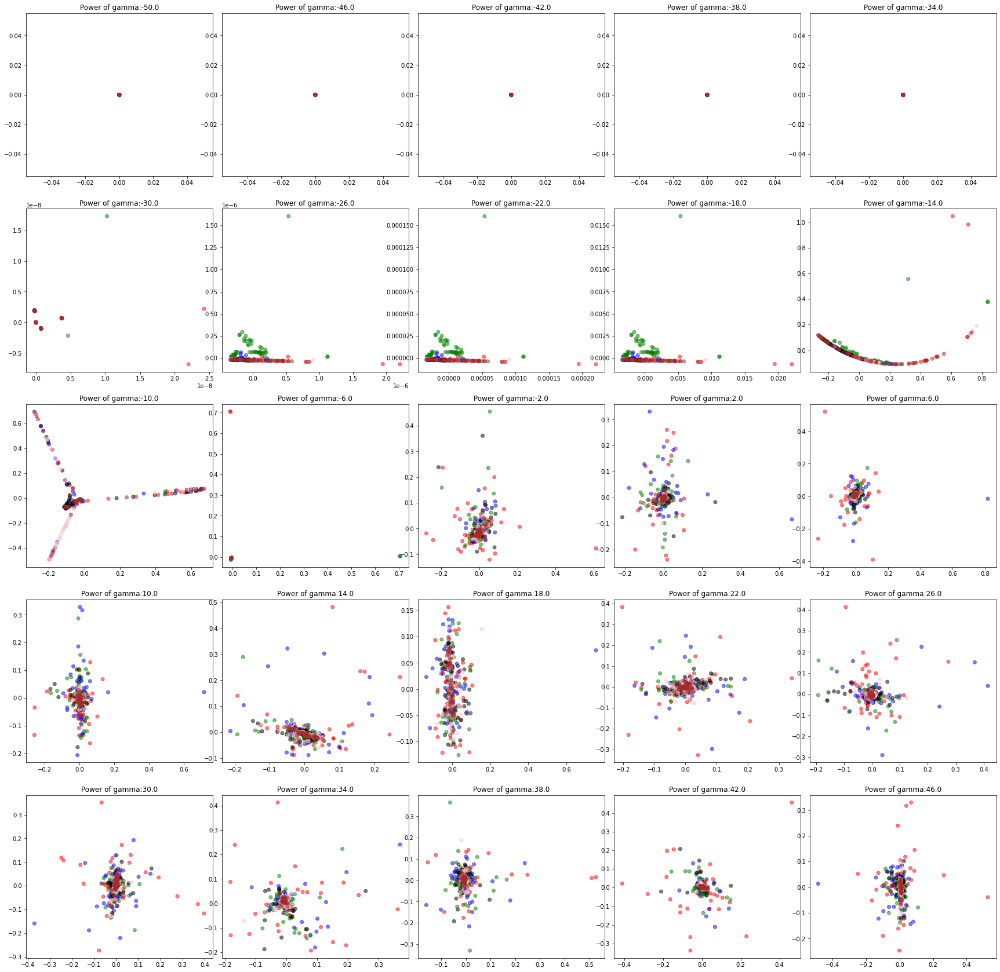

In [103]:
## PCA결과 Pastry가 데이터와 선형 관계가 없는 Defect인 것으로 관측. Pastry와 데이터 간의 비선형적 상관관계가 있는지를 알아보기.
# 데이터 X_5 (Steel Plate Faults 데이터)를 이용하고 sklearn.decomposition.KernelPCA를 활용하여 KernelPCA를 진행하고 플랏을 그림.
# 커널은 rbf로 진행.
# 비선형 관계 데이터를 선형으로 바꿔주는 적정한 gamma 값을 찾아야 함.
# 이를 결정하기 위하여 grid를 25개로 주고, 25개의 다양한 gamma값에 대하여 KenrnelPCA를 진행하고 플랏을 그린 후 적정 gamma에 대하여 고민하기.
# 본 과정은 gamma의 범위를 좁혀가며 여러번 진행될 수 있음.
from sklearn.decomposition import KernelPCA
color_code2 = {'Pastry':'Red', 'Z_Scratch':'Blue', 'K_Scatch':'Green', 'Stains':'Black', 'Dirtiness':'Pink', 'Bumps':'Brown', 'Other_Faults':'Gold'}

g_start=-50
g_end=50
g_power = np.arange(g_start,g_end,(g_end-g_start)/25)
fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)
y_color2=[color_code2.get(i)for i in y_5]

for n , ax in enumerate(axs.flatten()):
  g_value=10**(g_power[n])
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_5)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_color2,alpha=0.5)
  ax.set_title('Power of gamma:' +str(g_power[n]))

plt.suptitle('', y = 0.95)
plt.subplots_adjust(wspace=0.05)
plt.show()


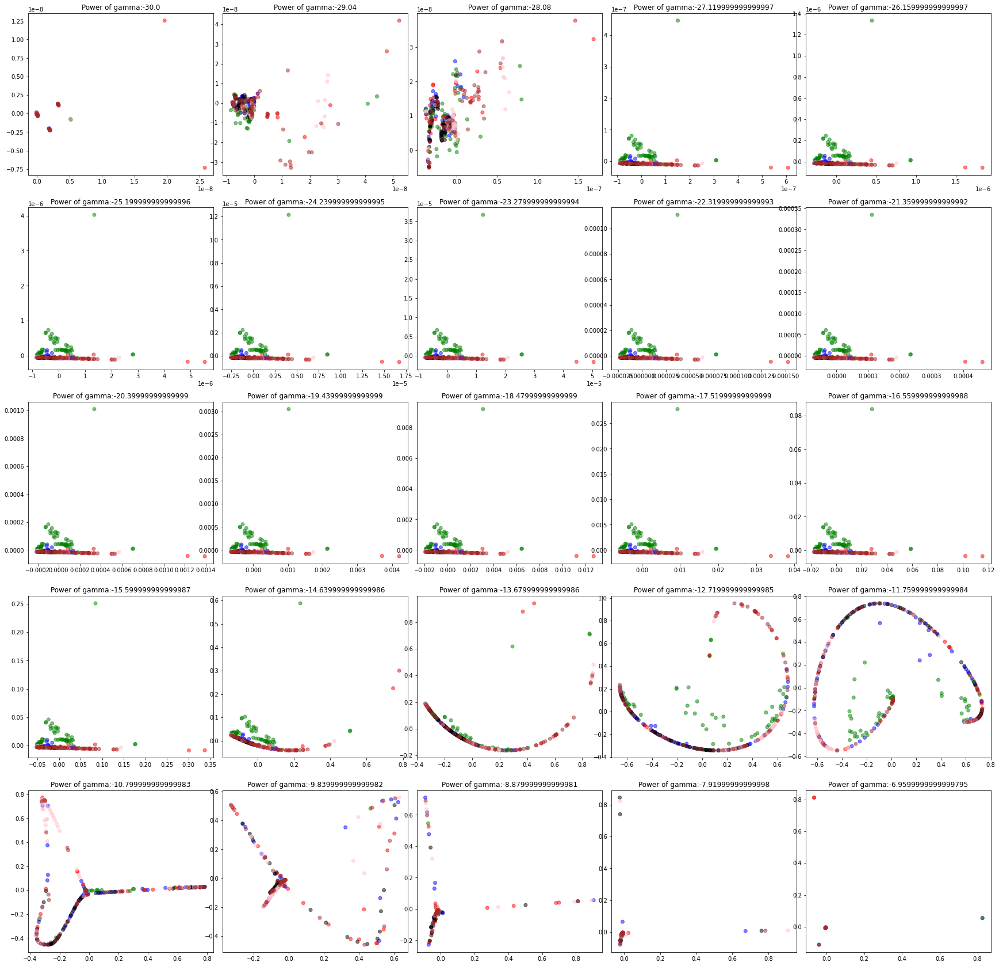

In [104]:
g_start=-30
g_end=-6
g_power = np.arange(g_start,g_end,(g_end-g_start)/25)
fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)
y_color2=[color_code2.get(i)for i in y_5]

for n , ax in enumerate(axs.flatten()):
  g_value=10**(g_power[n])
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_5)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_color2,alpha=0.5)
  ax.set_title('Power of gamma:' +str(g_power[n]))

plt.suptitle('', y = 0.95)
plt.subplots_adjust(wspace=0.05)
plt.show()


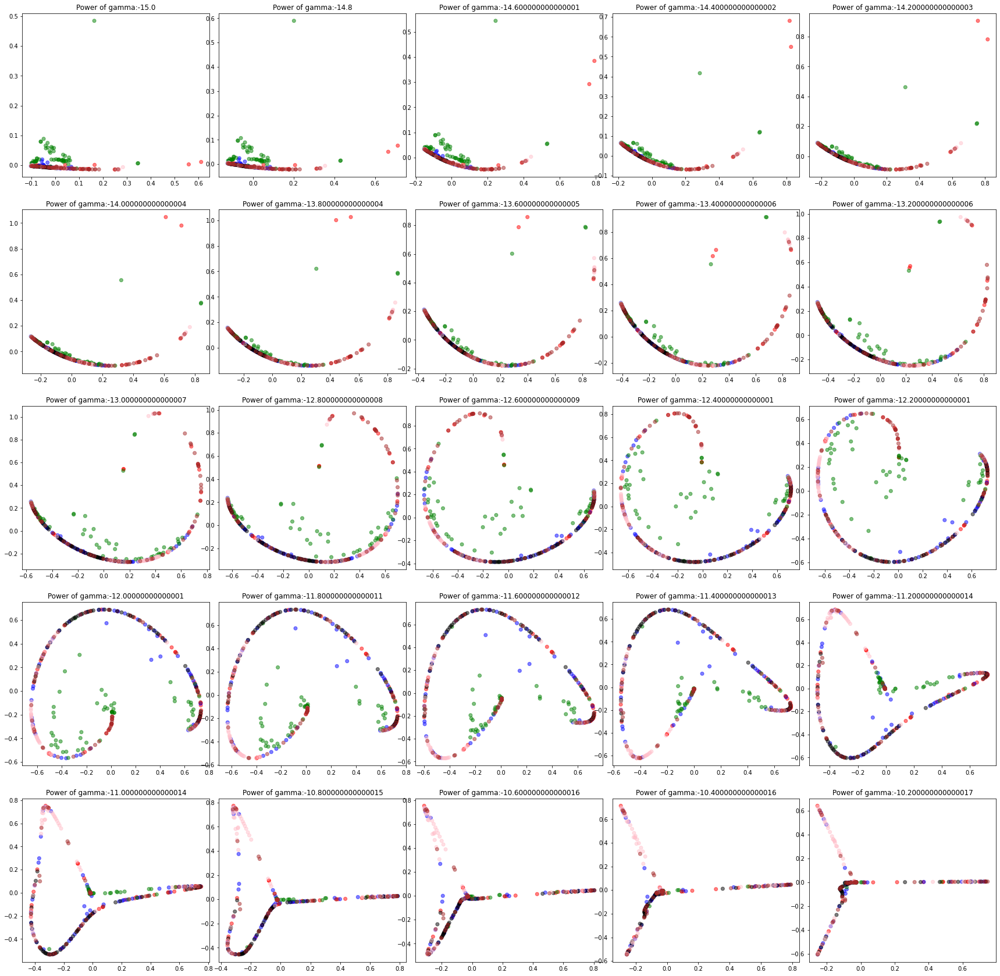

In [105]:
g_start=-15
g_end=-10
g_power = np.arange(g_start,g_end,(g_end-g_start)/25)
fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)
y_color2=[color_code2.get(i)for i in y_5]

for n , ax in enumerate(axs.flatten()):
  g_value=10**(g_power[n])
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(X_5)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_color2,alpha=0.5)
  ax.set_title('Power of gamma:' +str(g_power[n]))

plt.suptitle('', y = 0.95)
plt.subplots_adjust(wspace=0.05)
plt.show()


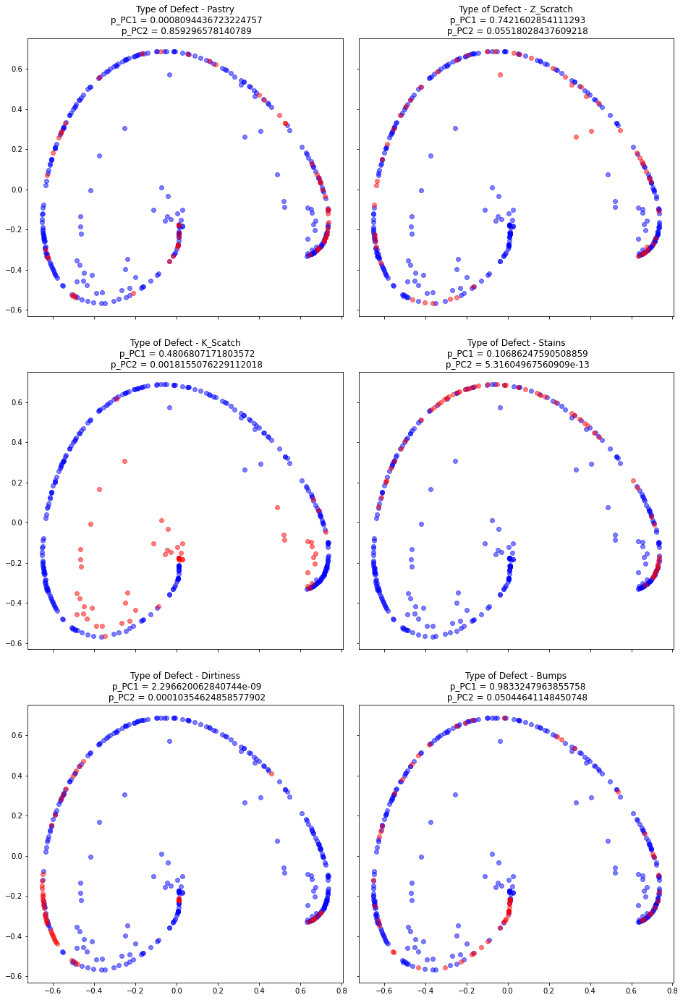

In [106]:
# power of gamma는 -12로 지정하고 KernelPCA를 실행.
g_power_val=-12
g_value=10**(g_power_val)
scikit_kpca = KernelPCA(n_components=2, kernel='rbf', gamma=g_value)
X_skernpca = scikit_kpca.fit_transform(X_5)

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(16,24), sharex=True, sharey=True)

for n, ax in enumerate(axs.flatten()):
    t, p = stats.ranksums(X_skernpca[y_5!=choices2[n], 0],X_skernpca[y_5==choices2[n], 0])
    t2, p2 = stats.ranksums(X_skernpca[y_5!=choices2[n], 1],X_skernpca[y_5==choices2[n], 1])  
    ax.scatter(X_skernpca[y_5!=choices2[n], 0], X_skernpca[y_5!=choices2[n], 1], color='blue', alpha=0.5)
    ax.scatter(X_skernpca[y_5==choices2[n], 0], X_skernpca[y_5==choices2[n], 1], color='red', alpha=0.5)
    ax.set_title('Type of Defect - ' + choices2[n]+"\n p_PC1 = " + str(p)+"\n p_PC2 = " + str(p2), size = 12)


plt.suptitle('', y = 0.95)
plt.subplots_adjust(wspace=0.05)
plt.show()

In [107]:
# Box plot을 통하여 PC1, PC2와 Pastry의 상관관계를 통계적으로 검정함.
Target_defect="Pastry"
arry_tmp=np.array([X_skernpca[:,0],X_skernpca[:,1],np.select([y_5==Target_defect,y_5!=Target_defect],[Target_defect,"Others"])])
tips=pd.DataFrame(arry_tmp.transpose(),columns=["PC1","PC2","x_val"])
tips['PC1'] = pd.to_numeric(tips['PC1'])
tips['PC2'] = pd.to_numeric(tips['PC2'])
tips.head()

from scipy import stats
t, p = stats.ttest_ind(tips['PC1'][tips['x_val']==Target_defect], tips['PC1'][tips['x_val']!=Target_defect])
t2, p2 = stats.ttest_ind(tips['PC2'][tips['x_val']==Target_defect], tips['PC2'][tips['x_val']!=Target_defect])
print("t_PC1 = " + str(round(t,5)),"/ p_PC1 = " + str(p))
print("t_PC2 = " + str(round(t2,5)),"/ p_PC2 = " + str(p2))

t_PC1 = 3.21067 / p_PC1 = 0.0014553380692986762
t_PC2 = -0.46121 / p_PC2 = 0.644951292684684


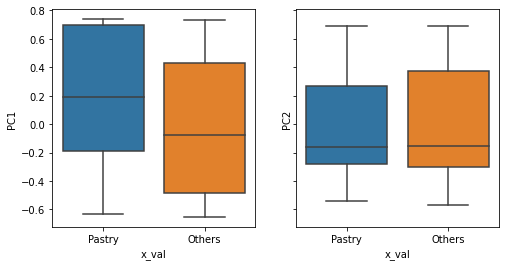

In [108]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8,4), sharex=True, sharey=True)
for n, ax in enumerate(axs.flatten()):
    sns.boxplot(x="x_val", y="PC"+str(n+1),  data=tips, ax=axs[n])

plt.show()

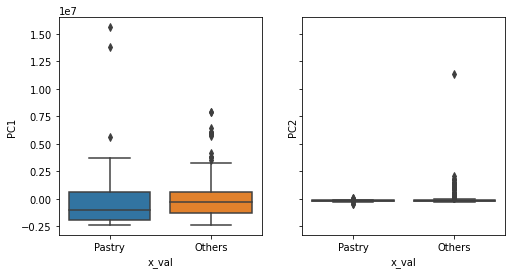

In [109]:
arry_tmp2=np.array([X_spca[:,0],X_spca[:,1],np.select([y_5==Target_defect,y_5!=Target_defect],[Target_defect,"Others"])])
tips2=pd.DataFrame(arry_tmp2.transpose(),columns=["PC1","PC2","x_val"])
tips2['PC1'] = pd.to_numeric(tips2['PC1'])
tips2['PC2'] = pd.to_numeric(tips2['PC2'])
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8,4), sharex=True, sharey=True)
for n, ax in enumerate(axs.flatten()):
    sns.boxplot(x="x_val", y="PC"+str(n+1),  data=tips2, ax=axs[n])

plt.show()